In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

from rliable import library as rly
from rliable import metrics
from rliable import plot_utils

In [ ]:
def plot_matrix(matrix, title=None, save=None):
    ''' 
    Visualize the whole transfer matrix in 2D. 
    The three-dimensional context space is mapped sequentially onto a one-dimensional space.
    '''
    # Plot the matrix
    plt.imshow(matrix, 
               cmap='viridis',  # Colormap
               aspect='auto')   # Aspect ratio

    # Add a colorbar
    cbar = plt.colorbar()  # Store the colorbar object
    cbar.ax.tick_params(labelsize=18)  # Set the fontsize of colorbar tick labels

    # Set axis labels
    plt.xlabel('Target task', fontsize=18)
    plt.ylabel('Source task', fontsize=18)

    # Set font size for x and y axis tick labels
    plt.tick_params(axis='x', labelsize=18)  # Set x-axis tick label font size
    plt.tick_params(axis='y', labelsize=18)  # Set y-axis tick label font size

    # Set title if provided
    if title:
        plt.title(title, fontsize=16)
    
    plt.tight_layout()  # Adjust layout to prevent overlap
    # Save the figure if a filename is provided
    if save:
        plt.savefig(save, bbox_inches='tight', dpi=300)

    # Show the plot
    plt.show()

In [ ]:
def plot_matrix_for_dims_average(matrix, context_range):
    '''
    Visualize the average transfer matrix of 3D context space in each dimension. Each matrix is averaged over the other two dimensions.
    context_range: a list of number of discretized contexts for each dimension, from the dimension with smallest index to the largest index
    '''
    n1, n2, n3 = context_range
    mean_matrix = np.zeros([n1, n1])
    for i in range(n2*n3):
        mean_matrix+=matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    mean_matrix/=(n2*n3)
    plot_matrix(mean_matrix)

    mean_matrix = np.zeros([n2, n2])
    for i in range(n1*n3):
        ii = i%n1 + (i//n1) * (n1*n2)
        mean_matrix+=matrix[ii:ii+(n1*n2):n1,ii:ii+(n1*n2):n1]
    mean_matrix/=(n1*n3)
    plot_matrix(mean_matrix)

    mean_matrix = np.zeros([n3, n3])
    for i in range(n1*n2):
        mean_matrix+=matrix[i:i+(n1*n2*n3):(n1*n2), i:i+(n1*n2*n3):(n1*n2)]
    mean_matrix/=n1*n2
    plot_matrix(mean_matrix)

## Transfer matrix

### Synthetic data

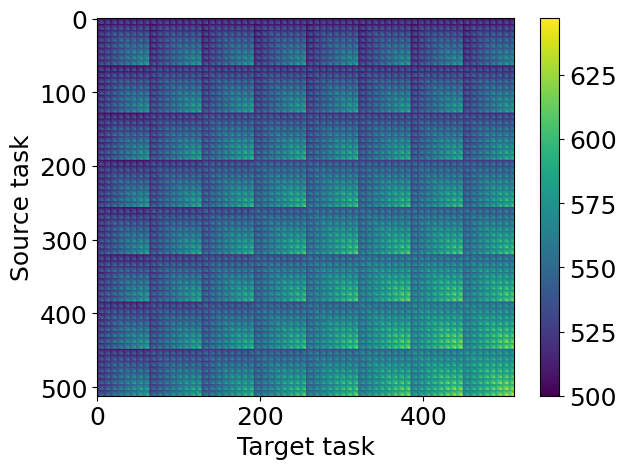

In [ ]:
matrix_path = "data/transfer_reward_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.npy"
matrix = np.load(matrix_path)

plot_matrix(matrix, save="figures/transfer_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.png")
matrix = np.where(np.isnan(matrix), np.nanmean(matrix), matrix)
context_dims=[8, 8, 8]

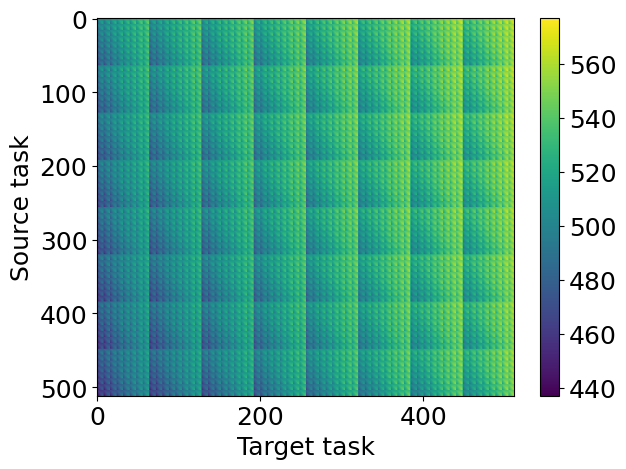

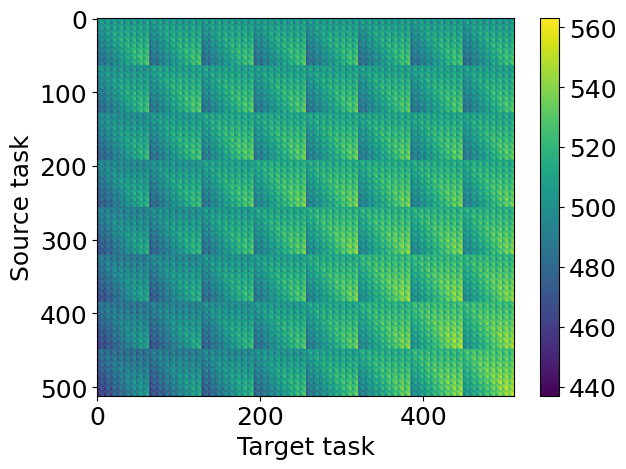

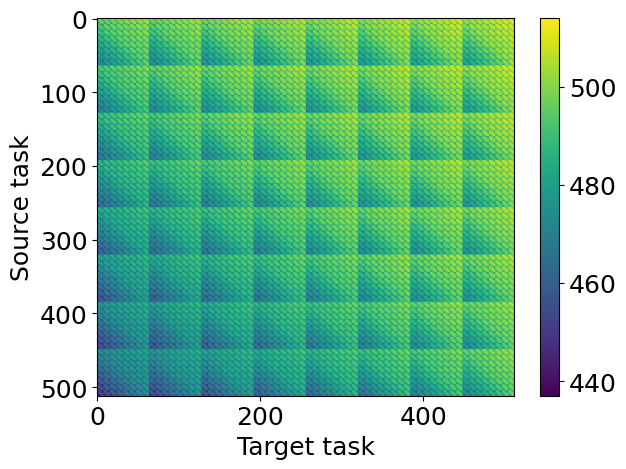

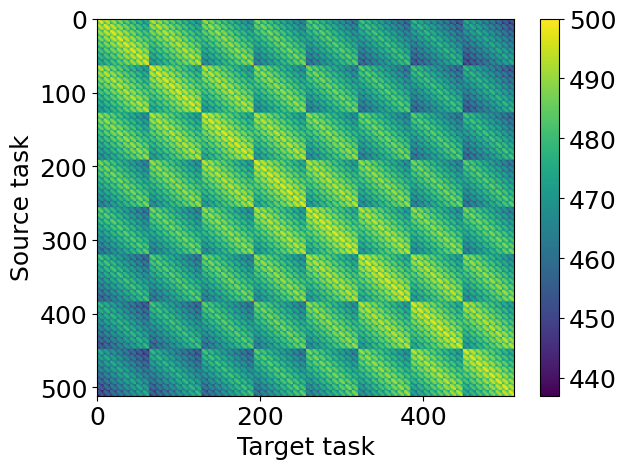

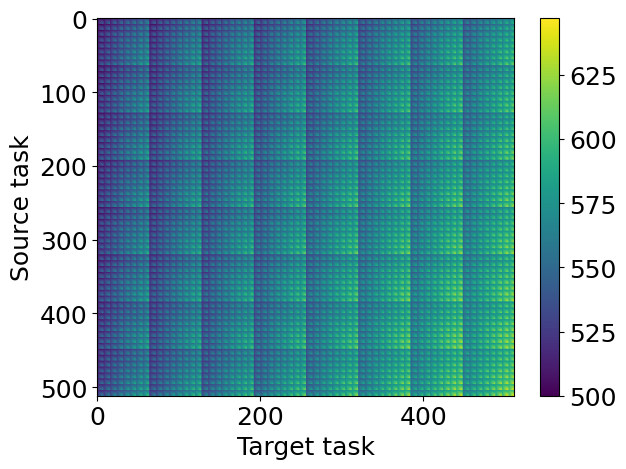

...

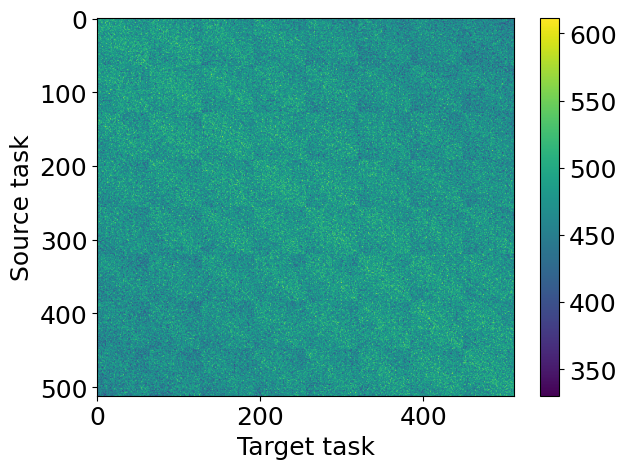

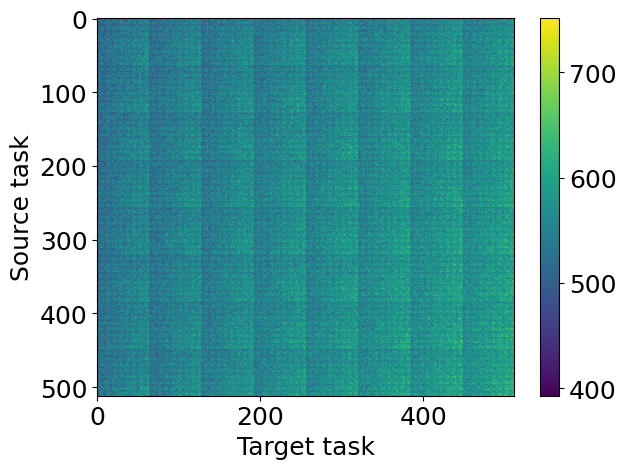

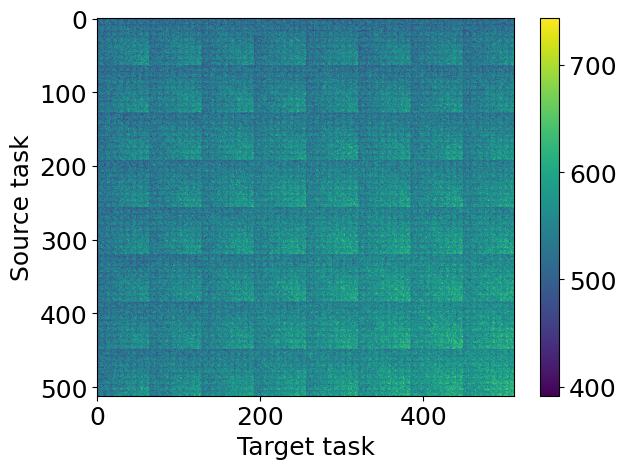

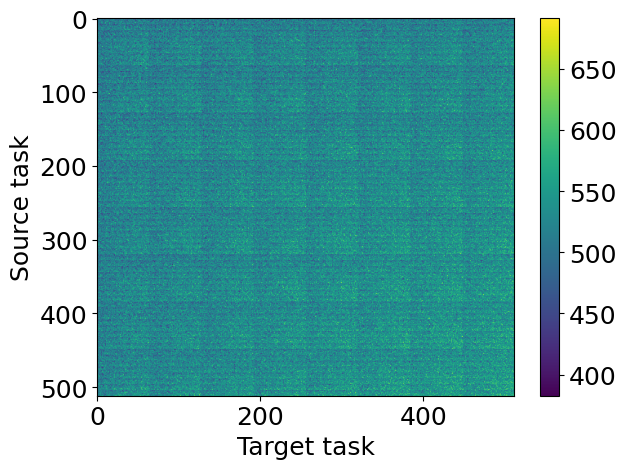

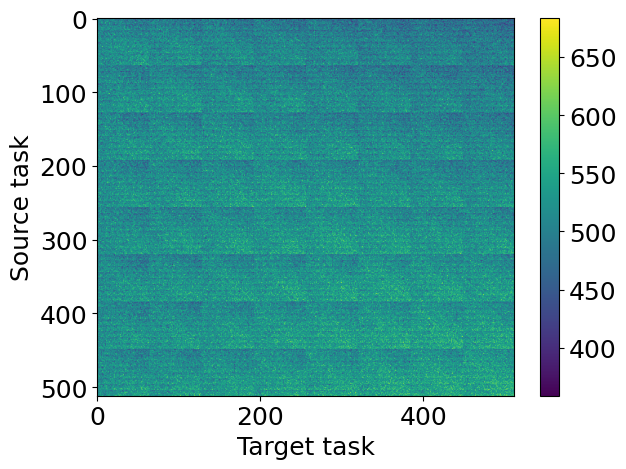

In [5]:
noise_list = [0, 5, 30]
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for noise in noise_list
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

for name in synthetic_combinations:
    # matrix_path = "data/transfer_reward_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.npy"
    matrix_path = f"data/transfer_reward_matrix_{name}_trial0.npy"
    matrix = np.load(matrix_path)

    plot_matrix(matrix, save=f"figures/transfer_matrix_{name}_trial0.png")

### CyclesGym (Crop Management)

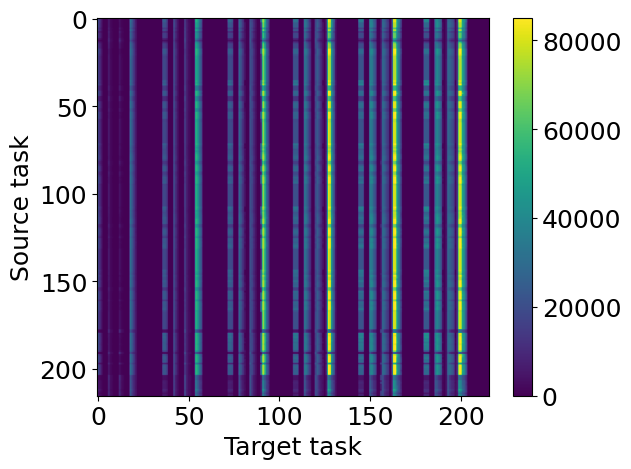

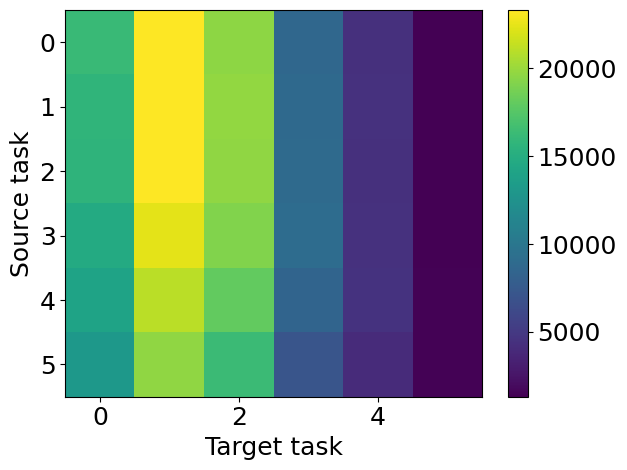

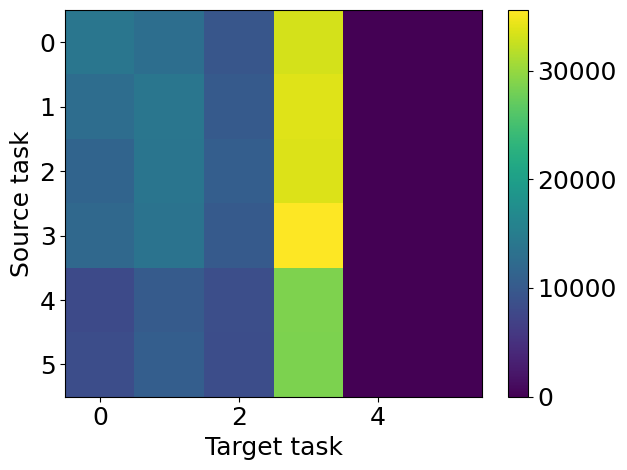

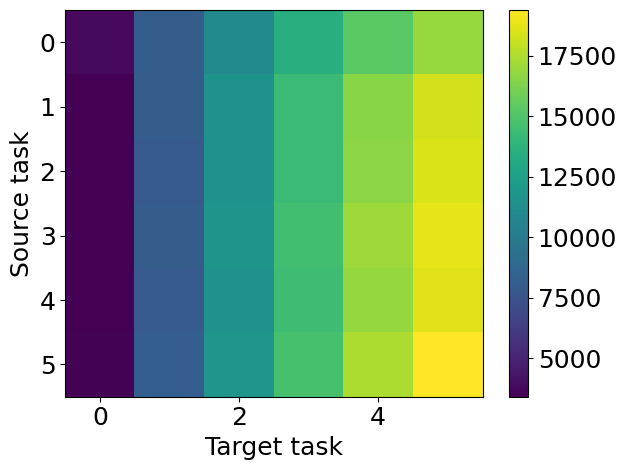

In [ ]:
matrix_path = "data/transfer_reward_matrix_crop_trial2.npy"
matrix = np.load(matrix_path)
# Tranfer matrix
plot_matrix(matrix)
matrix = np.where(np.isnan(matrix), np.nanmean(matrix), matrix)
context_dims=[6, 6, 6]
# Average transfer matrix over the other two dimensions
plot_matrix_for_dims_average(matrix, context_dims)

### Bipedal Walker

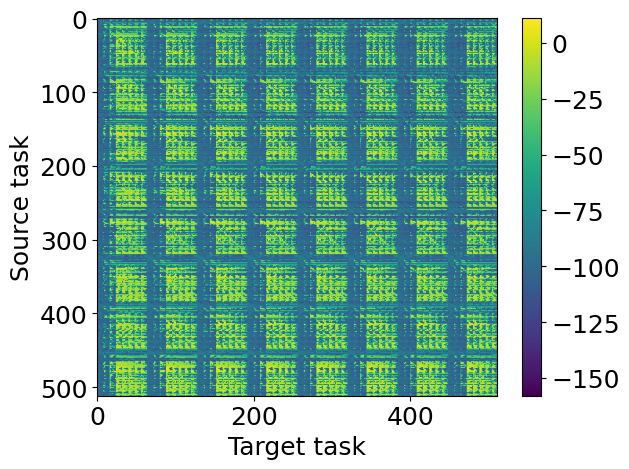

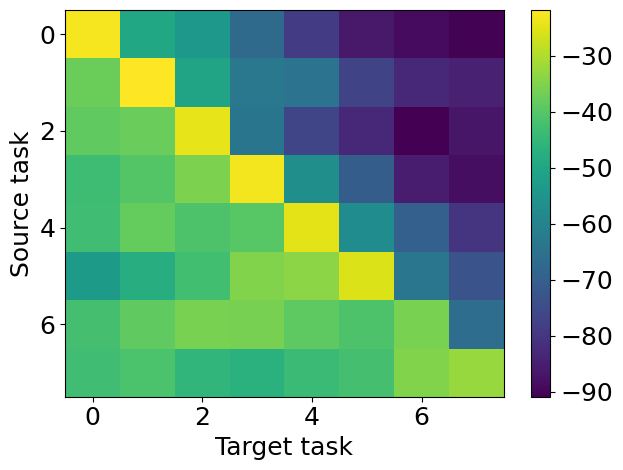

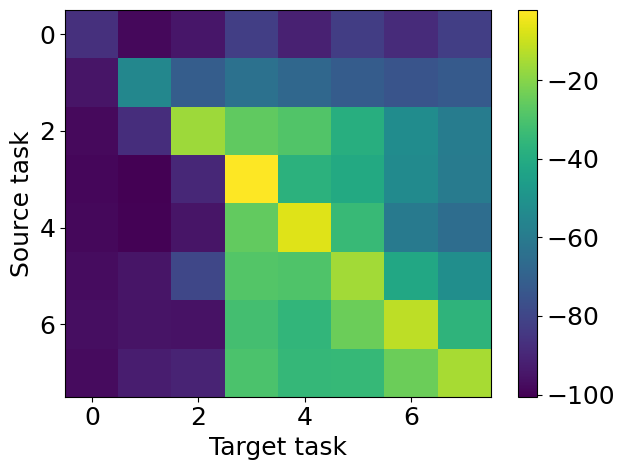

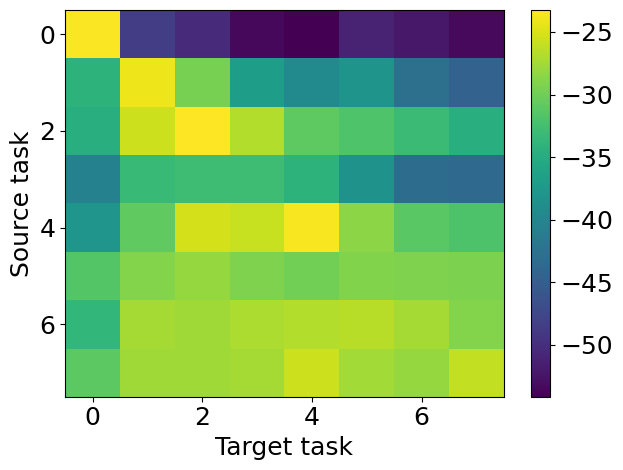

In [ ]:
matrix_path = "data/transfer_reward_bipedalwalker_matrix_8_trial0.npy"
matrix = np.load(matrix_path)
# Transfer matrix
plot_matrix(matrix)
context_dims=[8, 8, 8]
# Average transfer matrix over the other two dimensions
plot_matrix_for_dims_average(matrix, context_dims)

### Cart-pole

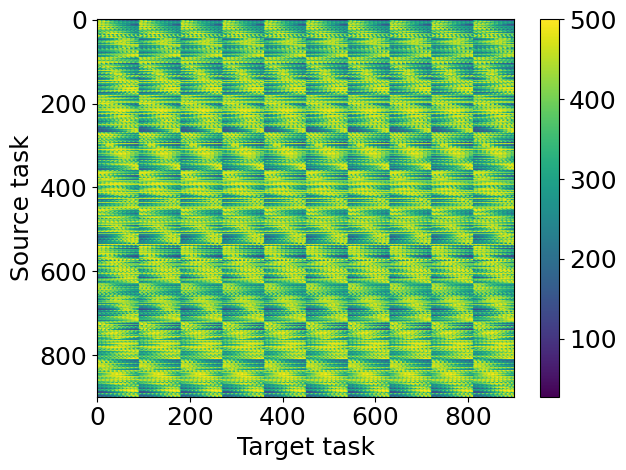

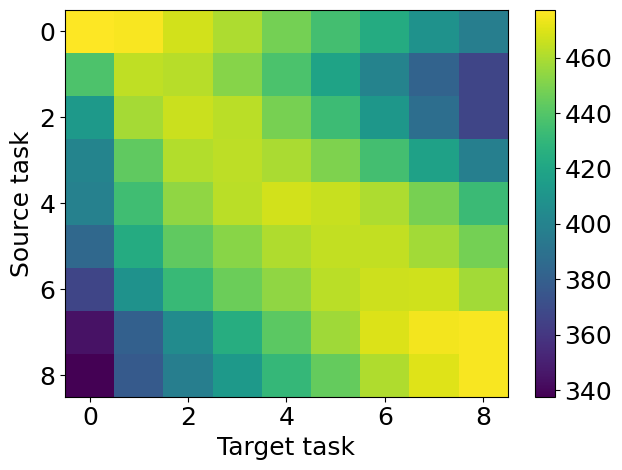

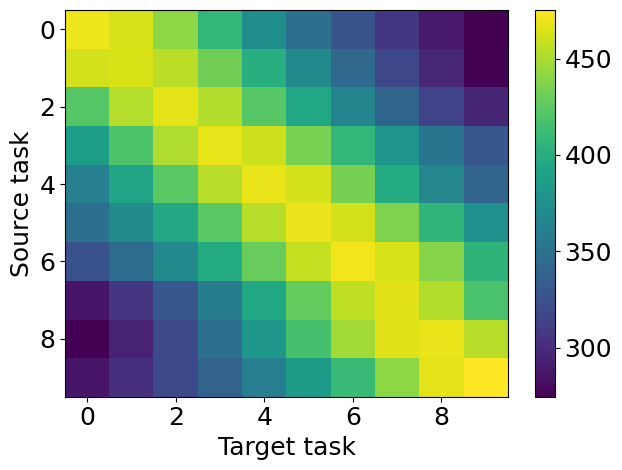

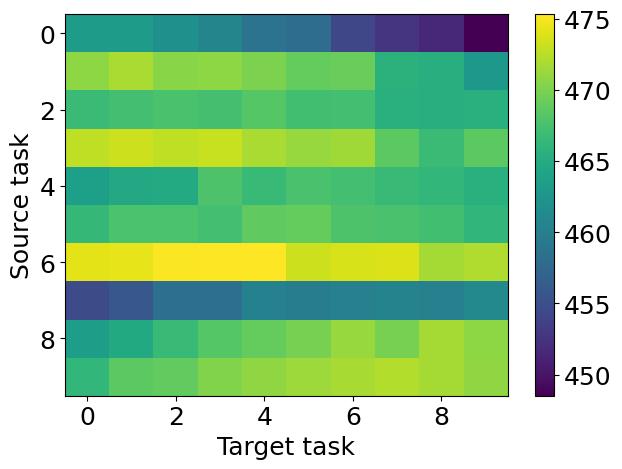

In [ ]:
matrix_path = "data/transfer_reward_matrix_trial0.npy"
matrix = np.load(matrix_path)
# Transfer matrix
plot_matrix(matrix)
context_dims=[9, 10, 10]
# Average transfer matrix over the other two dimensions
plot_matrix_for_dims_average(matrix, context_dims)

### IntersectionZoo

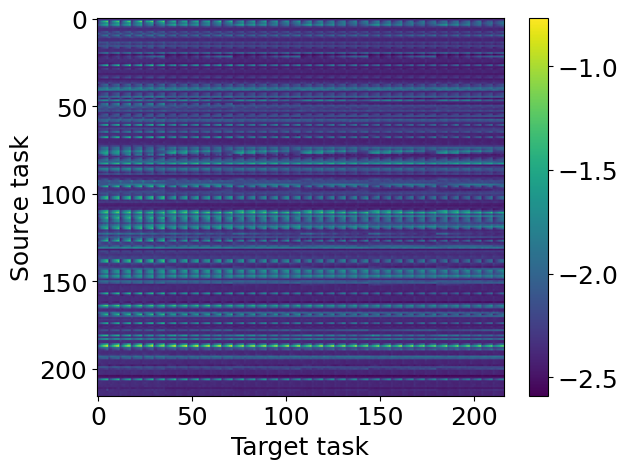

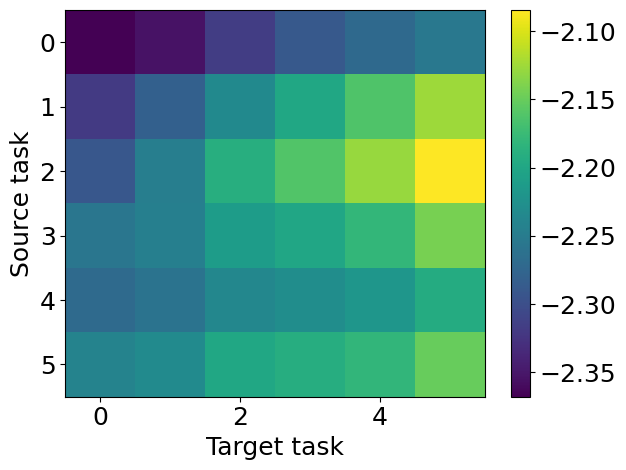

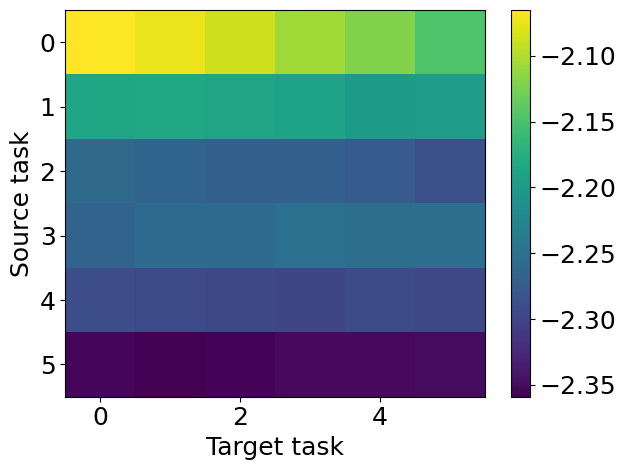

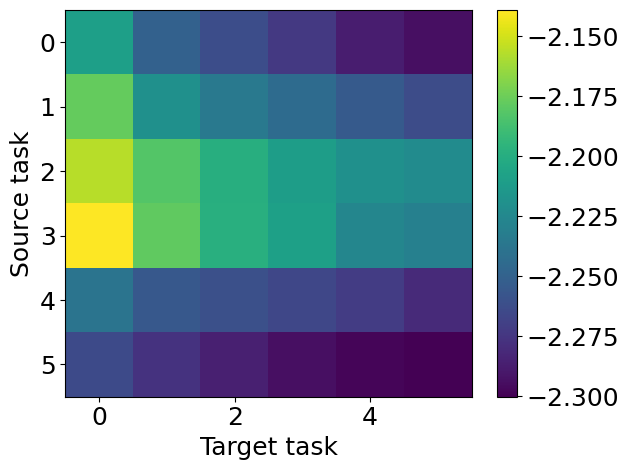

In [ ]:
matrix_path = "data/transfer_reward_array_intersectionzoo_trial0.npy"
# Transfer matrix
matrix = np.load(matrix_path)
plot_matrix(matrix)
context_dims=[6, 6, 6]
# Average transfer matrix over the other two dimensions
plot_matrix_for_dims_average(matrix, context_dims)

# Plot Performance

In [11]:
def plot(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))
    # plt.figure(figsize=(12, 9))

    for alg_name in name_plot.keys():
        # print(alg_name)
        if alg_name == "multi_task":
            if len(multi_task_performance) == K:
                mean_vals = np.mean(multi_task_performance, axis=1)
                std_vals  = np.std(multi_task_performance, axis=1)
            else:
                mean_vals = np.mean(multi_task_performance) * np.ones(K)
                std_vals  = np.std(multi_task_performance) * np.ones(K)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [12]:
def plot_time(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    # plt.figure(figsize=(8, 6))
    # plt.figure(figsize=(12, 9))
    plt.figure(figsize=(9, 6))
    for alg_name in name_plot.keys():
        # print(alg_name)
        if alg_name == "multi_task":
            data_array = multi_task_performance
            mean_vals = np.mean(data_array, axis=1)
            std_vals  = np.std(data_array, axis=1)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.1, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Runtime", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.yscale("log")
    plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if save_name:
        plt.savefig(f"figures/result_time_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [13]:
def plot_ablation(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))
    # plt.figure(figsize=(12, 9))

    for alg_name in name_plot.keys():
        # print(alg_name)
        if alg_name == "multi_task":
            if len(multi_task_performance) == K:
                mean_vals = np.mean(multi_task_performance, axis=1)
                std_vals  = np.std(multi_task_performance, axis=1)
            else:
                mean_vals = np.mean(multi_task_performance) * np.ones(K)
                std_vals  = np.std(multi_task_performance) * np.ones(K)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_ablation_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [14]:
multi_task_performance = None
name_plot = {
    # "sequential_clustering_sampling_fixed": "SCC (Ours)",
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task",
    "random_select": "Random",
    "MBTL": "GP-MBTL",
    "without_learning_weight": "M-MBTL (Ours)",
    # "Combined_alg": "Hybrid-MBTL (Ours)",
    # "Combined_alg_new": "Hybrid-MBTL-new (Ours)",
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    # "oracle": "Oracle",
}
linestyle = {
    "Combined_alg_mountain": "-",
    # "Combined_alg_new": "-",
    # "Combined_alg": "-",
    "multi_task": "--",
    "random_select":"-",
    "without_learning_weight": "-",
    # "sequential_clustering_sampling_fixed": "-",
    "independent_training": "--", 
    "stochastic_oracle": "--",
    "myopic_oracle": "--",
    "oracle": "--",
    "MBTL": "-",
    "random_mountain": "--",
    "random_GP": "--",
}
cmap = plt.get_cmap('Accent').colors
# cmap = plt.get_cmap('tab10').colors
color = {
    "Combined_alg_mountain": cmap[4],
    # "Combined_alg_new": cmap[3],
    # "Combined_alg":       cmap[4],
    "multi_task":         cmap[1],
    "random_select":      cmap[0],
    "without_learning_weight": cmap[5],
    "independent_training":    cmap[2],
    "stochastic_oracle":  cmap[3],
    "MBTL":               cmap[6],
    "myopic_oracle":      cmap[7],
    "random_mountain": cmap[5],
    "random_GP": cmap[6],
    # "oracle":            cmap[0],
}
ablation_name_plot = {
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    "random_select": "Random",
    "MBTL": "GP-MBTL",
    "without_learning_weight": "M-MBTL (Ours)",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
}
time_name_plot = {
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "Combined_alg_new": "Hybrid-MBTL-new (Ours)",
    # "Combined_alg": "Hybrid-MBTL (Ours)",
    # "multi_task": "Multi-task Training",
    # "independent_training": "Independent Training", 
    # "stochastic_oracle": "Stochastic Oracle",
    "without_learning_weight": "M-MBTL (Ours)",
    # "random_mountain": "M-MBTL + Random",
    # "random_GP": "GP-MBTL + Random",
    # "sequential_clustering_sampling_fixed": "SCC (Ours)",
    # "random_select": "Random",
    "MBTL": "GP-MBTL",
}
y_lim = None
log_scale = True

### Cartpole

[0.53888281 0.5904978  0.83247784 0.94416162 0.64419444 0.8837308
 0.87695511 0.99770855 0.88956999 0.99496214]
[0.79316965 0.91489338 0.98843443 0.97296026 0.97538639 0.89331062
 0.99998823 0.95799334 0.87767317 0.99537818]
[0.72604226 1.         1.         0.87100428 0.99840184 0.82278458
 0.99958805 0.96879142 0.70916419 0.99971593]
[0.99496214 0.99537818 0.99971593]


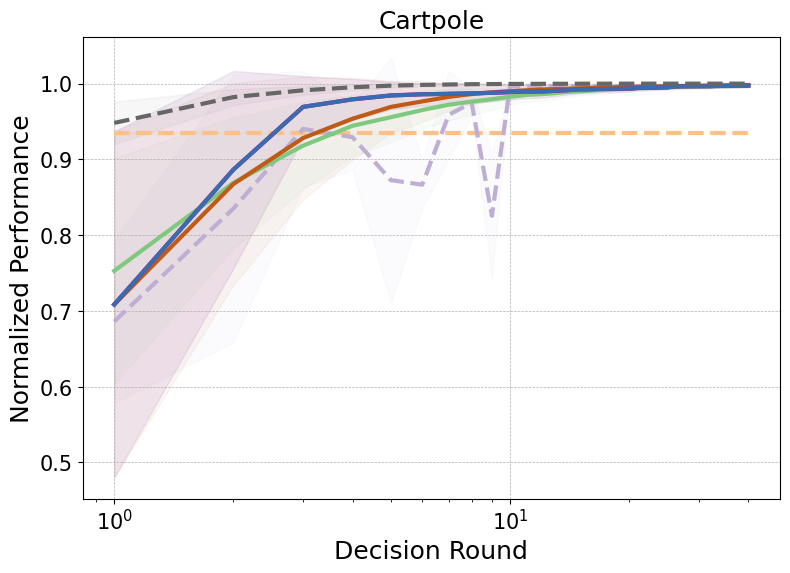

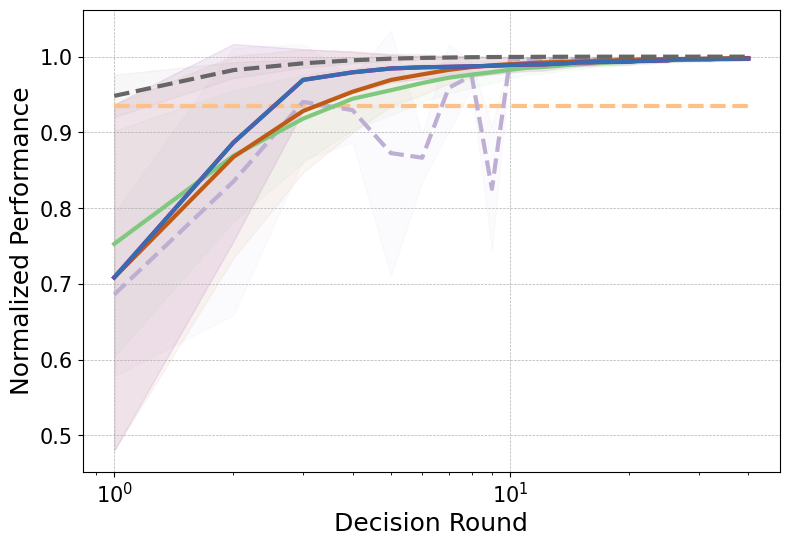

In [15]:
# Process multitask data
K=30
K=40 # temporal
# K=100
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)
multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_matrix_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    print(np.mean(indep_reward, axis=1))
    multi_task_list.append(np.mean(indep_reward, axis=1))
# max_index = np.argmax(np.mean(np.array(multi_task_list), axis=0))
# for trial in range(3):
#     multi_task_list[trial] = float(multi_task_list[trial][max_index])
# print(multi_task_list)
    # print(np.mean(indep_reward, axis=1).shape)
# multi_task_list_best = np.zeros_like(multi_task_list)
multi_task_performance_cartpole = np.array(multi_task_list).T
print(multi_task_performance_cartpole[-1])
for _ in range(K-len(multi_task_performance_cartpole)):
    multi_task_performance_cartpole = np.concatenate([multi_task_performance_cartpole, multi_task_performance_cartpole[-1][np.newaxis]], axis=0)
data_path=f"results/cartpole_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance_cartpole, plot_title="Cartpole")
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance_cartpole, save_name=f"cartpole_boot{K}")
# plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"cartpole_boot{K}")
# data_path=f"results/cartpole_boot_new_time_{K}_slope=0.01.npz"
# plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"cartpole_boot{K}")

### IntersectionZoo

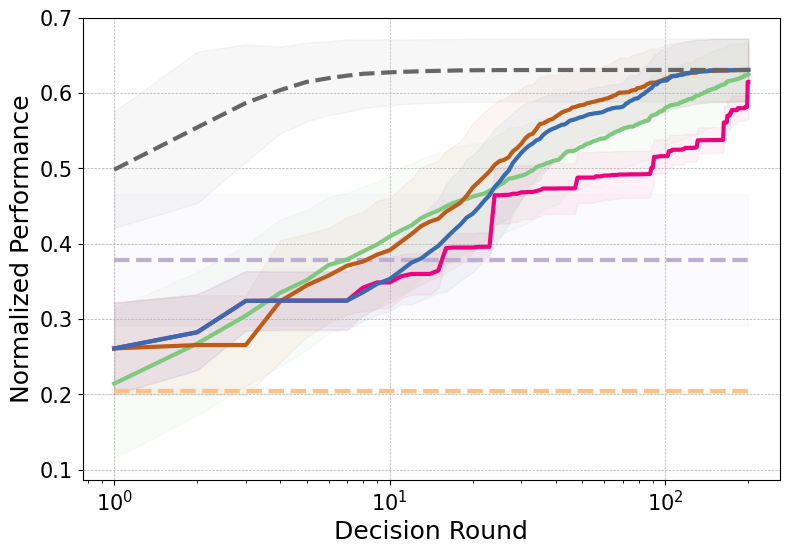

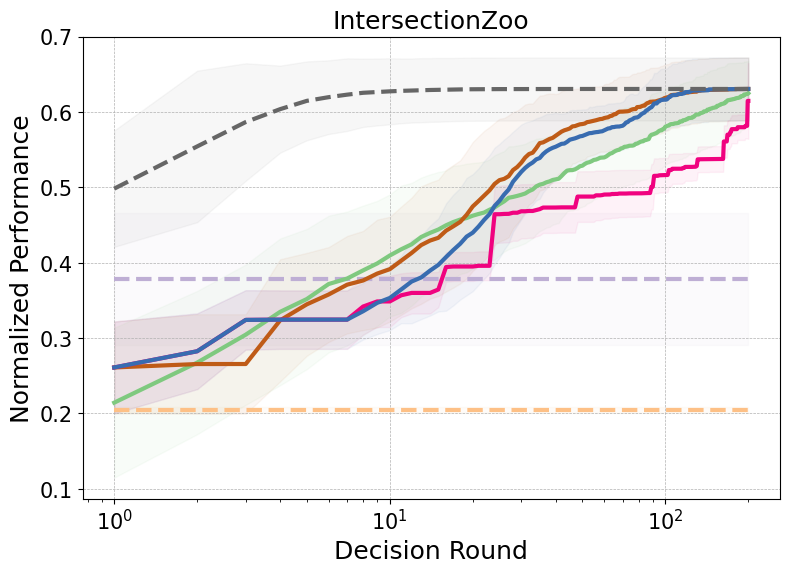

In [16]:
# K=216
K=200
# K=50 # temporal
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)
multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_reward_array_intersectionzoo_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward))
multi_task_performance_intersectionzoo = multi_task_list.copy()
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, plot_title="IntersectionZoo")
# plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")
# data_path=f"results/intersectionZoo_boot_new_time_{K}_slope=0.01.npz"
# plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")

### BipedalWalker

[0.63380428 0.63752186 0.33799826 0.30947457 0.41163306 0.45458563
 0.64557142 0.34388545]
[0.62023862 0.17321042 0.40574799 0.34026958 0.30915479 0.33338876
 0.68334495 0.31876079]
[0.44994235 0.44462982 0.62890164 0.16329676 0.22929378 0.26588838
 0.27492109 0.29884126]


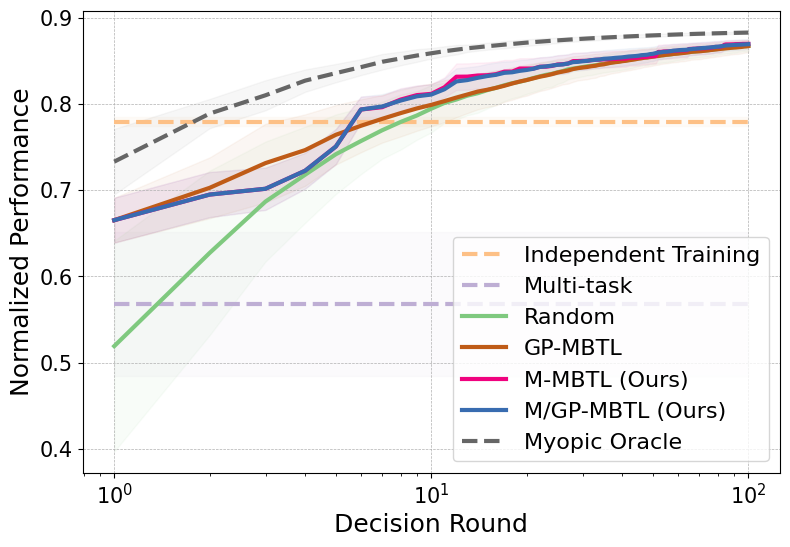

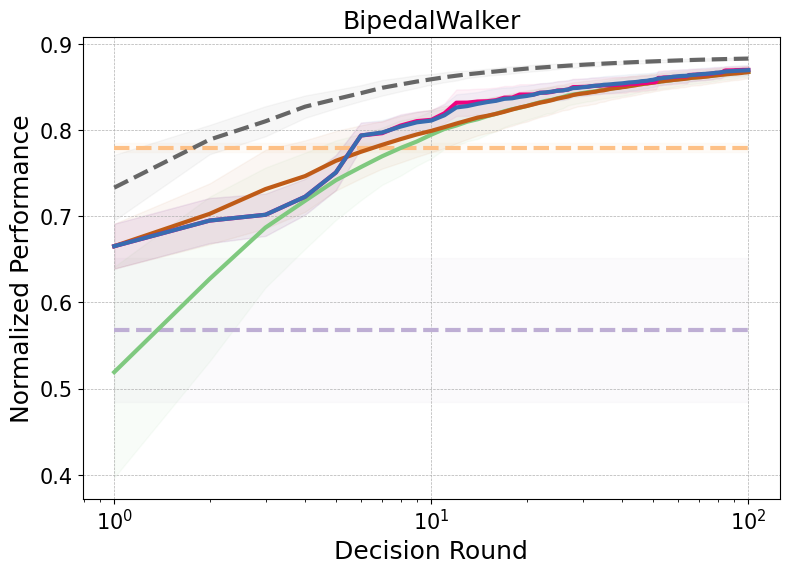

In [17]:
# K=256
K=80
K=100
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)

multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_bipedalwalker_matrix_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    print(np.mean(indep_reward, axis=1))
    multi_task_list.append(np.mean(indep_reward, axis=1))

max_index = np.argmax(np.mean(np.array(multi_task_list), axis=0))
for trial in range(3):
    multi_task_list[trial] = float(multi_task_list[trial][max_index])
multi_task_performance_walker = multi_task_list.copy()
# print(multi_task_performance_walker[-1])
# for _ in range(K-len(multi_task_performance_walker)):
#     multi_task_performance_walker = np.concatenate([multi_task_performance_walker, multi_task_performance_walker[-1][np.newaxis]], axis=0)
data_path=f"results/walker_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance_walker, save_name=f"walker_boot{K}", legend=True)
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance_walker, plot_title="BipedalWalker")
# plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"walker_boot{K}", legend=True)
# data_path=f"results/walker_boot_new_time_{K}_slope=0.01.npz"
# plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"walker_boot{K}")

### Crop management

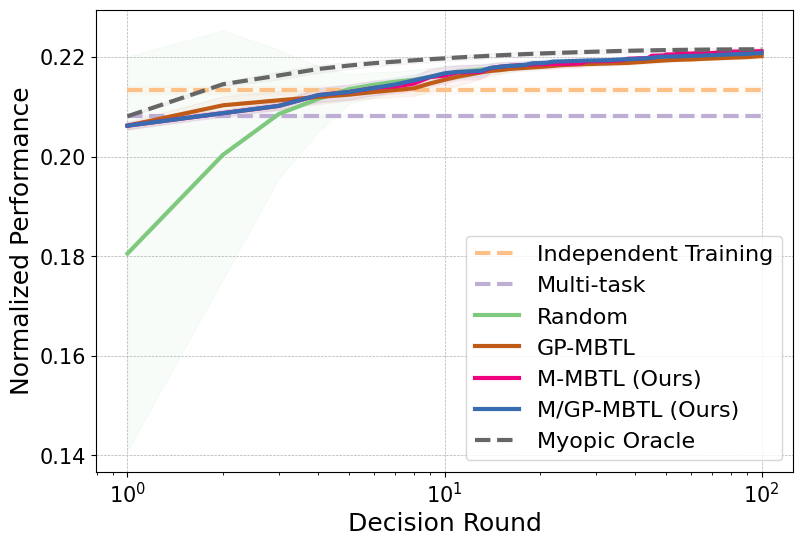

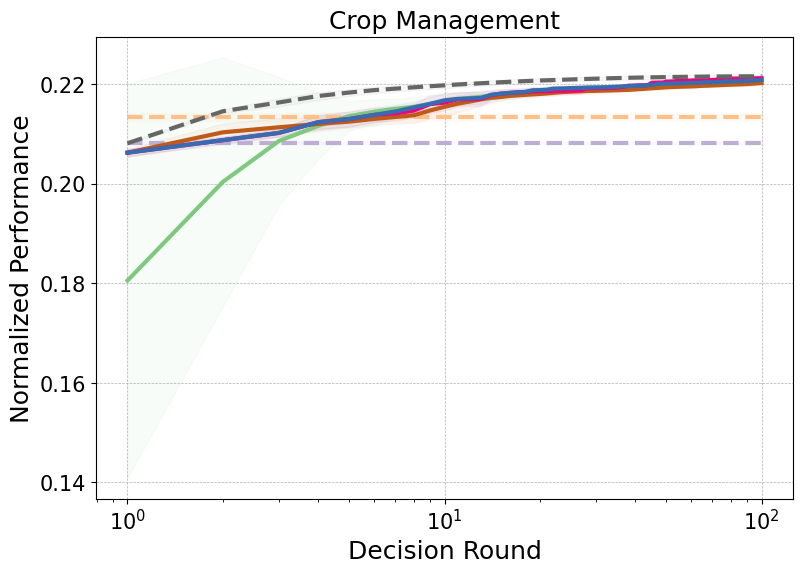

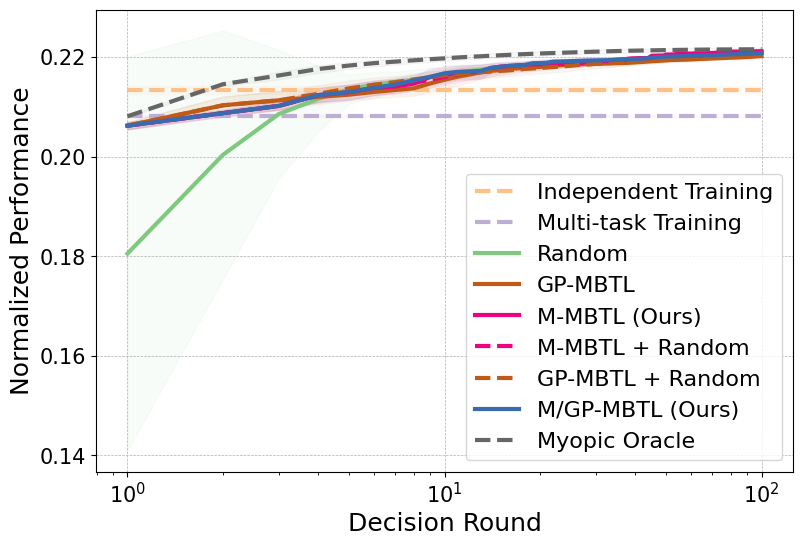

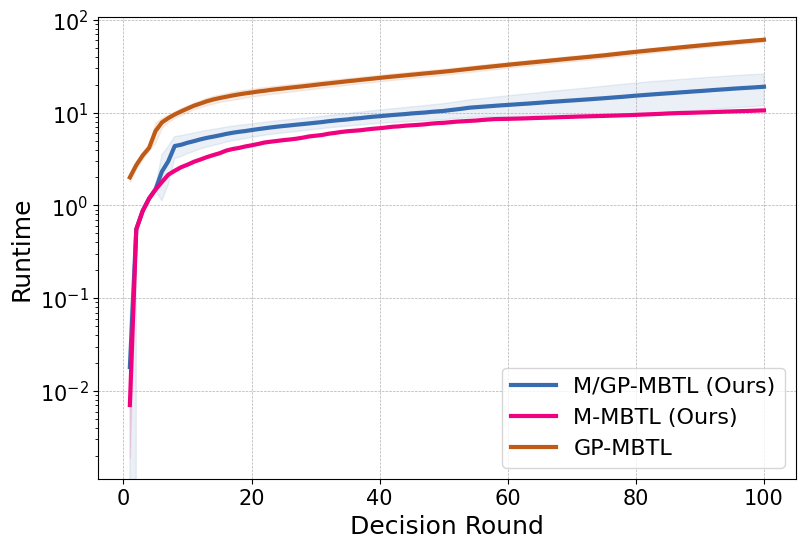

In [18]:
K=50
# K=216
K=100

min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)
multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_matrix_crop_new_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward))
    
multi_task_performance_crop = multi_task_list.copy()

data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}", legend=True)
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, plot_title="Crop Management")
plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}", legend=True)
data_path=f"results/crop_boot_new_time_{K}_slope=0.01.npz"
plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}")


## Synthetic data

In [19]:
def plot_synthetic(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))
    # plt.figure(figsize=(12, 9))

    for alg_name in name_plot.keys() - ["random_mountain", "random_GP"]:
        # print(alg_name)
        if alg_name == "multi_task":
            continue
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

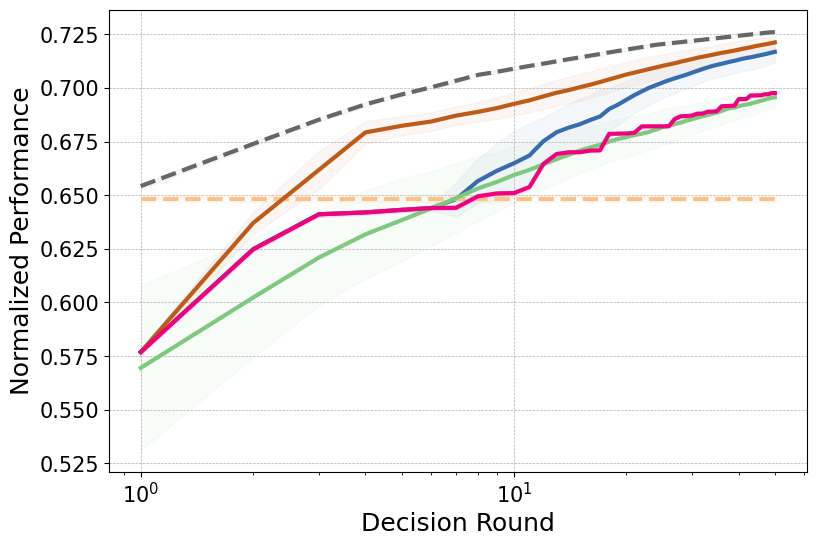

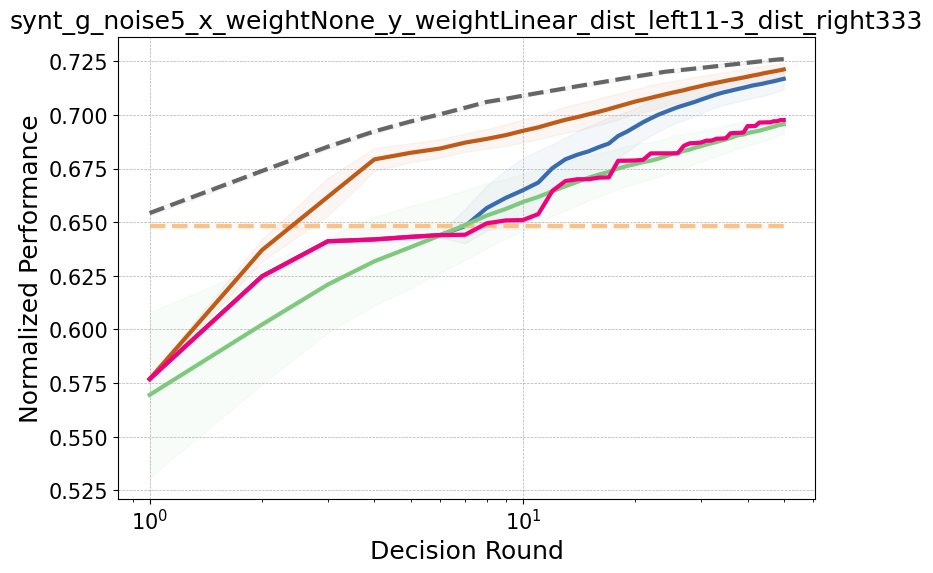

synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333


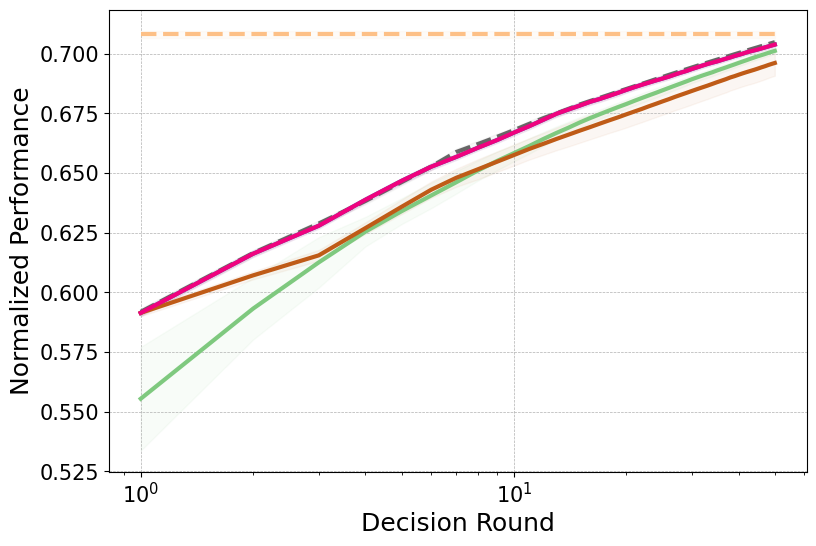

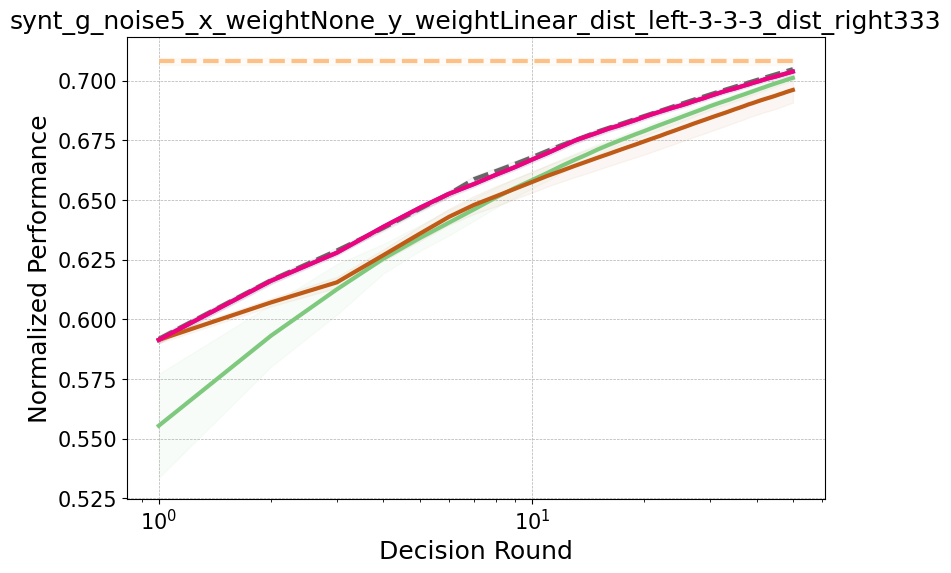

synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333


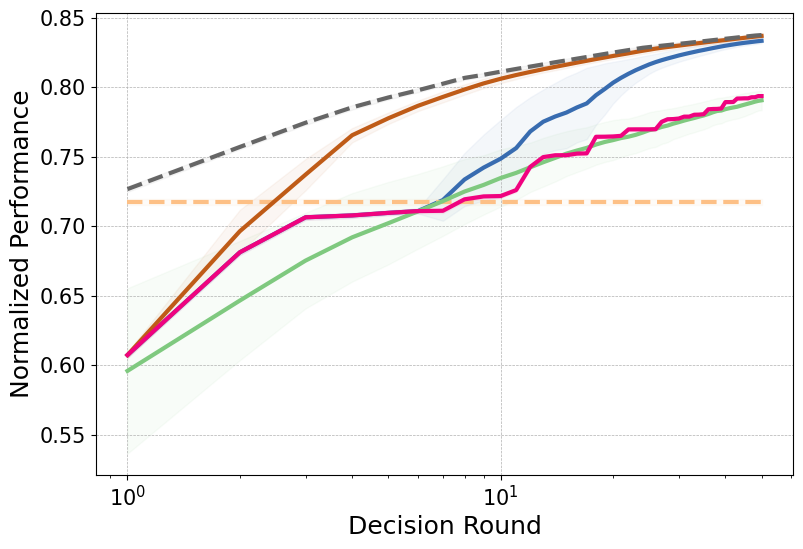

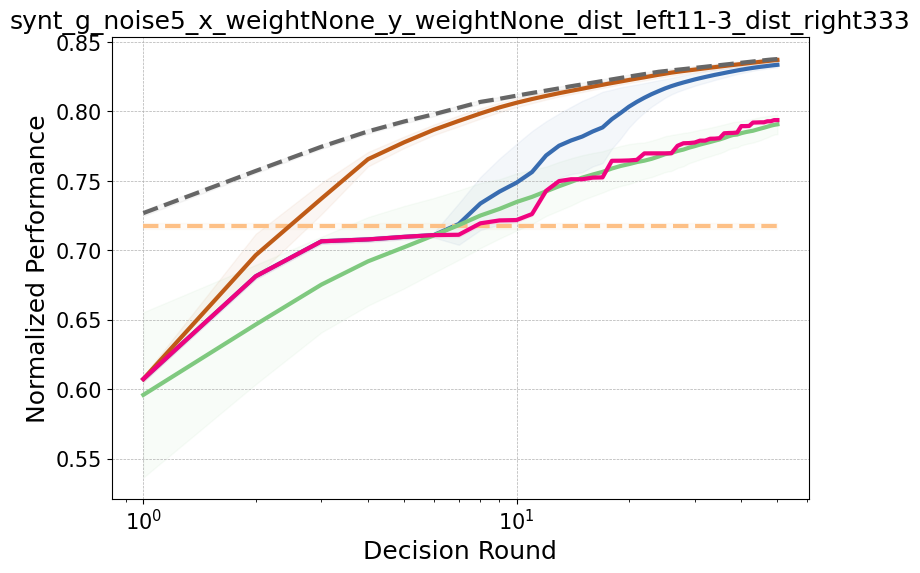

synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333


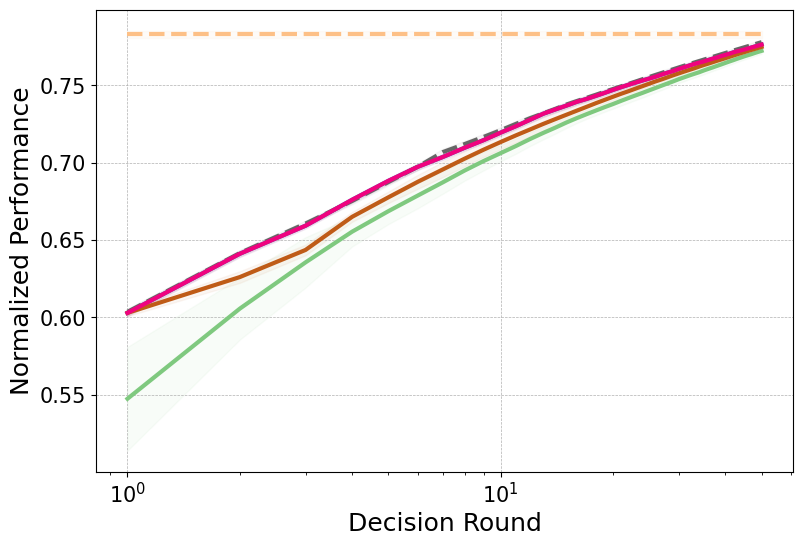

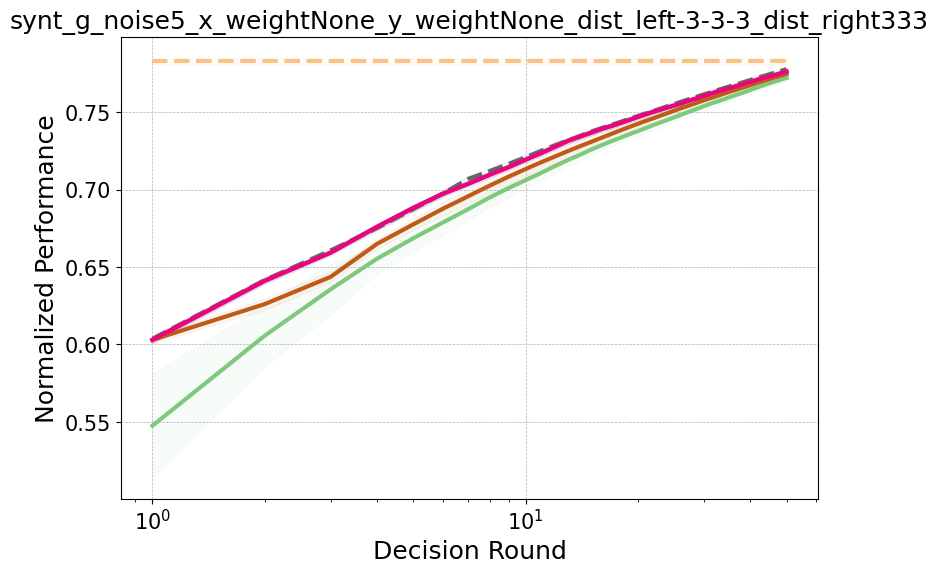

synt_g_noise5_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333


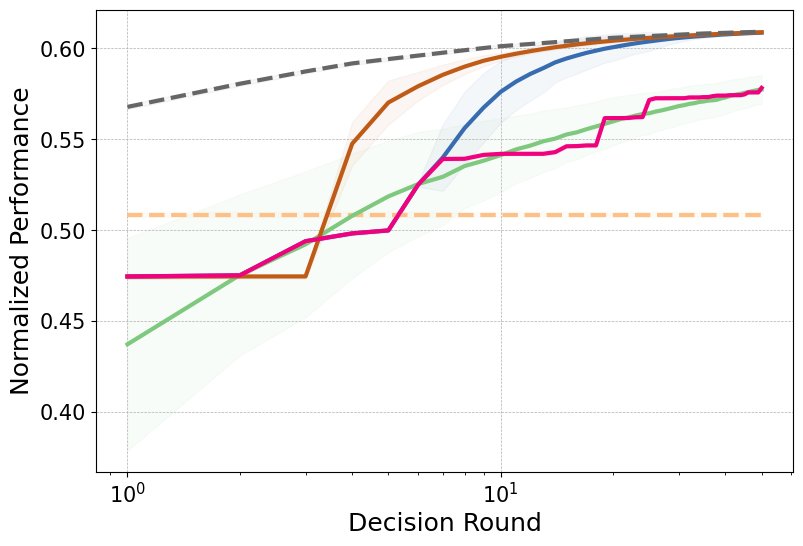

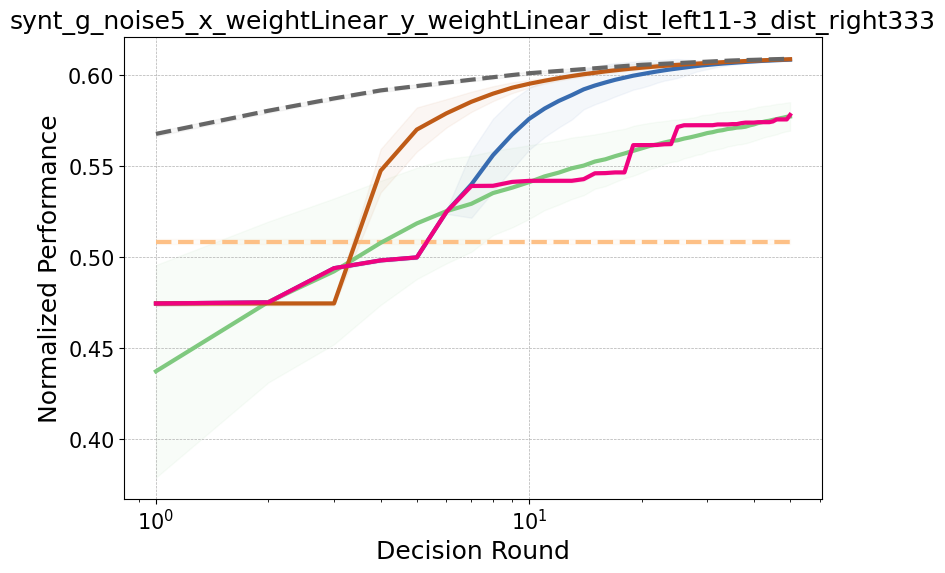

synt_g_noise5_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333


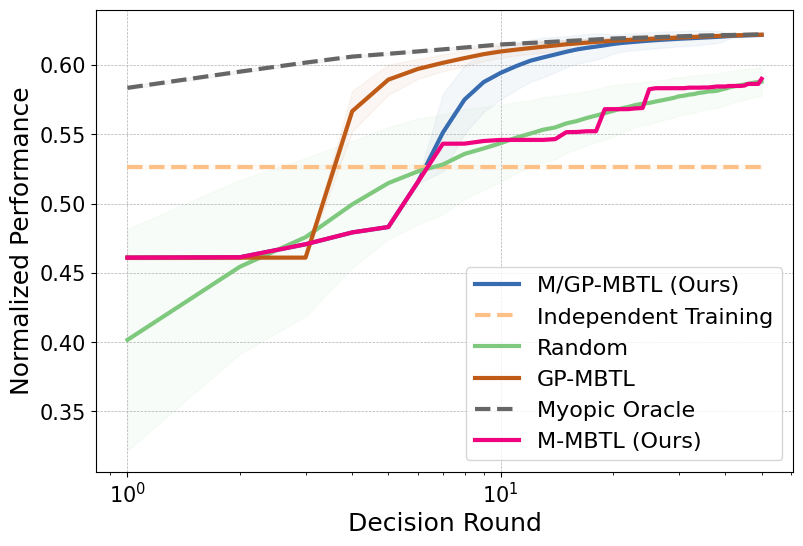

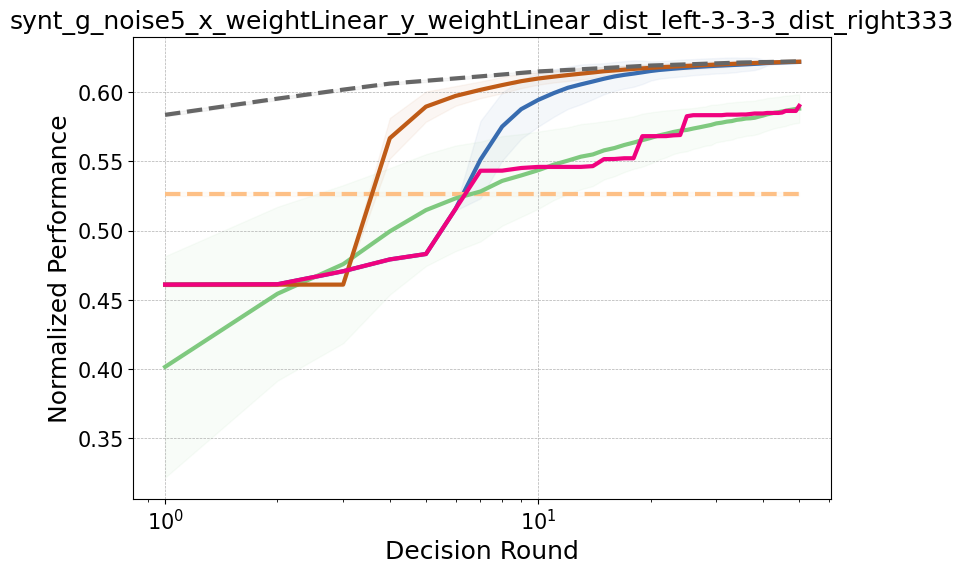

synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333


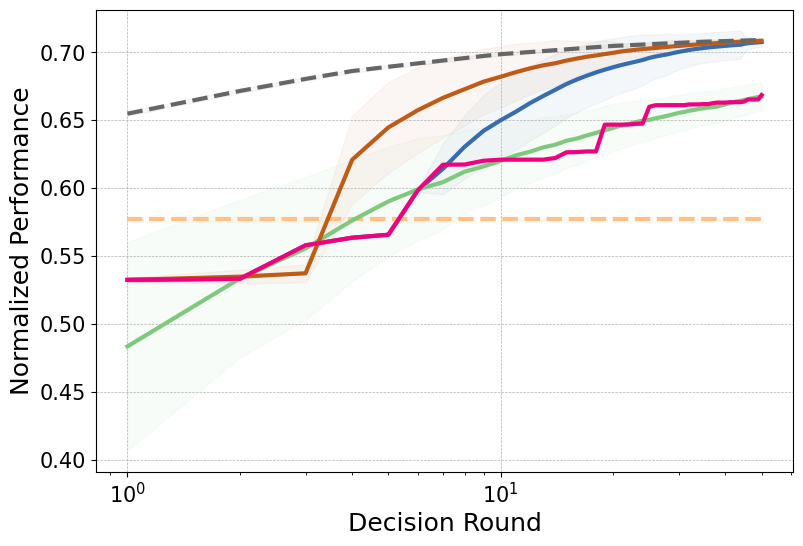

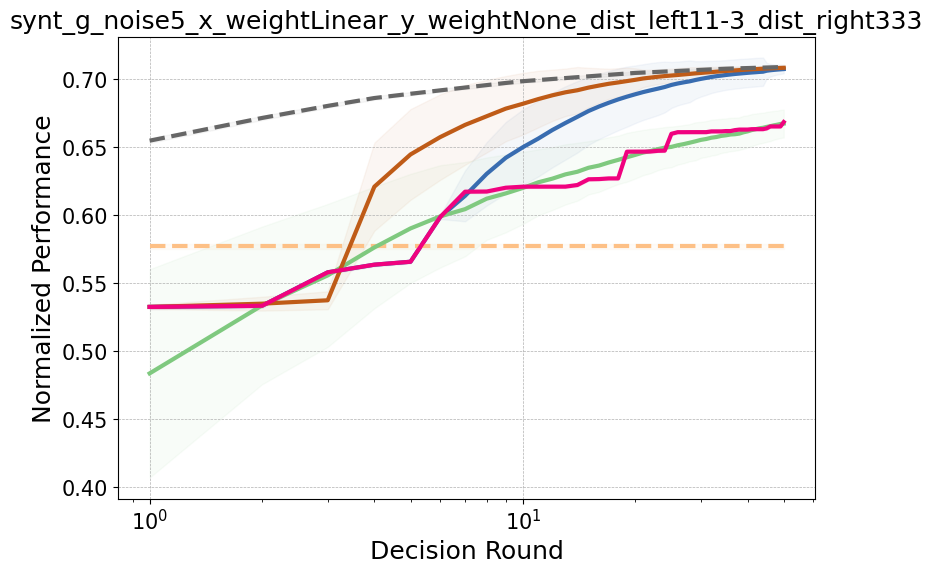

synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333


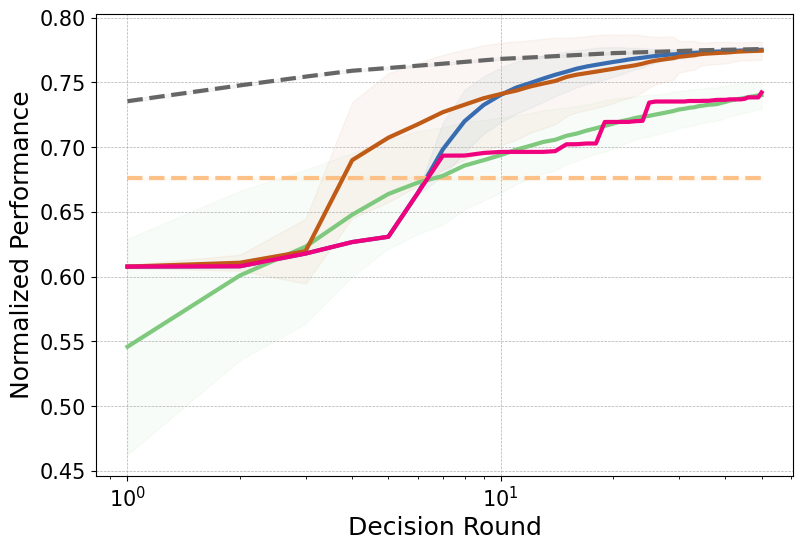

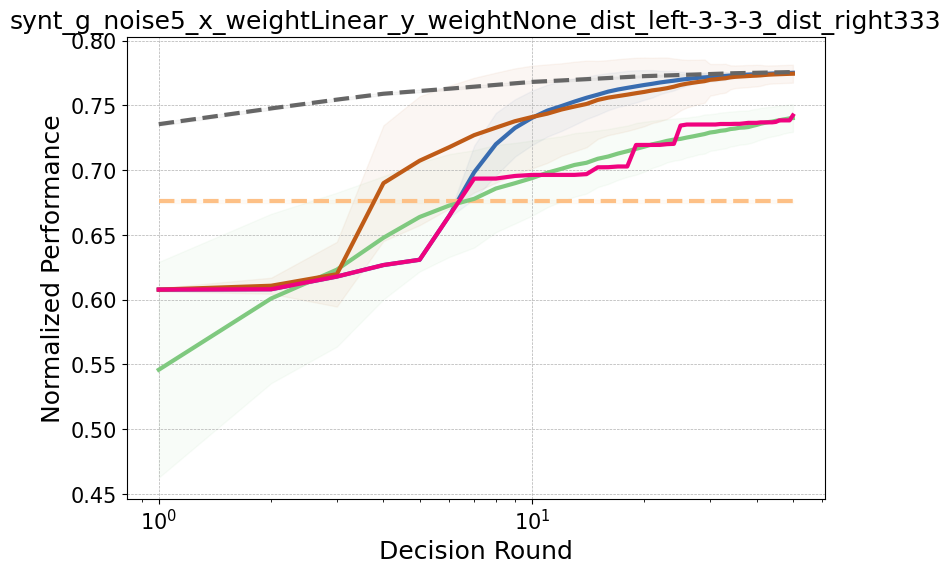

synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333


In [20]:
K=50
data_name = "synt_g"
# x_weight_list=[None, "333"]
# y_weight_list=[None, "333"]
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]

i = 0
for x_weight in x_weight_list:
    for y_weight in y_weight_list:
        for left_weight in dist_left_list:
            min_value = np.inf
            max_value = -np.inf
            name = f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
            # Assume that we already known the max and min value of the environment
            for trial in range(3):
                matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
                matrix = np.load(matrix_path)
                max_value_trial = np.max(matrix)
                min_value_trial = np.min(matrix)
                max_value = np.maximum(max_value, max_value_trial)
                min_value = np.minimum(min_value, min_value_trial)

            data_path=f"results/{name}_new_{K}_slope=0.01.npz"
            i+=1
            plot_true = True if i==6 else False
            plot_synthetic(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=None, save_name=f"{name}_K{K}", legend=plot_true)
            plot_synthetic(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=None, plot_title=f"{name}")
            print(name)

## IQM

In [21]:
name_plot = {
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "Combined_alg_new": "Hybrid-MBTL-new (Ours)",
    # "Combined_alg": "Hybrid-MBTL (Ours)",
    "without_learning_weight": "M-MBTL (Ours)",
    # "sequential_clustering_sampling_fixed": "SCC (Ours)",
    "MBTL": "GP-MBTL",
    "random_select": "Random",
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    # "oracle": "Oracle",
    # "random_mountain": "M-MBTL + Random",
    # "random_GP": "GP-MBTL + Random",
}
ablation_name_plot = {
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "Combined_alg_new": "Hybrid-MBTL-new (Ours)",
    # "Combined_alg": "Hybrid-MBTL (Ours)",
    "without_learning_weight": "M-MBTL (Ours)",
    # "sequential_clustering_sampling_fixed": "SCC (Ours)",
    "MBTL": "GP-MBTL",
    "random_select": "Random",
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    # "oracle": "Oracle",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
}
algorithms = ["Myopic Oracle", "M/GP-MBTL (Ours)", "GP-MBTL", "M-MBTL (Ours)", "Random"]
ablation_algorithms = ["Myopic Oracle", "M/GP-MBTL (Ours)", "GP-MBTL", "M-MBTL (Ours)", "GP-MBTL + Random", "M-MBTL + Random", "Random"]
# algorithms = ["Stochastic Oracle", "Hybrid-MBTL-mountain (Ours)", "Hybrid-MBTL-new (Ours)", "Hybrid-MBTL (Ours)", "GP-MBTL", "SC-MBTL", "Random"]

In [22]:

cmap = plt.get_cmap('Accent').colors
color_real = {
    "M/GP-MBTL (Ours)": cmap[4],
    "Random":      cmap[0],
    "M-MBTL (Ours)": cmap[5],
    "Stochastic Oracle":  cmap[3],
    "GP-MBTL":               cmap[6],
    "Myopic Oracle":      cmap[7],
    # "Oracle":            cmap[0],
    "M-MBTL + Random": cmap[2],
    "GP-MBTL + Random": cmap[1],
}

In [23]:
aggregate_func = lambda x: np.array([
  metrics.aggregate_median(x),
  metrics.aggregate_iqm(x),
  metrics.aggregate_mean(x)])

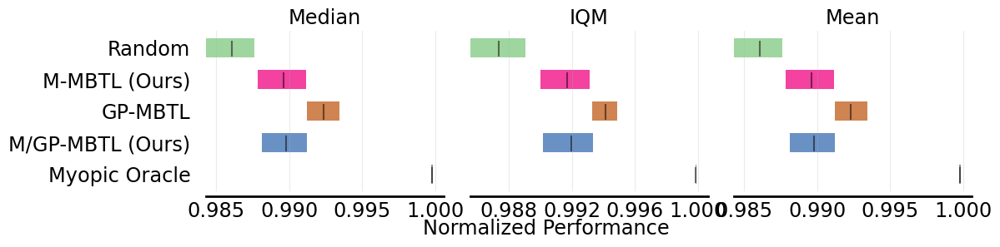

In [24]:
K=12
data_path=f"results/cartpole_boot_new_{15}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()

dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func, reps=500)
fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

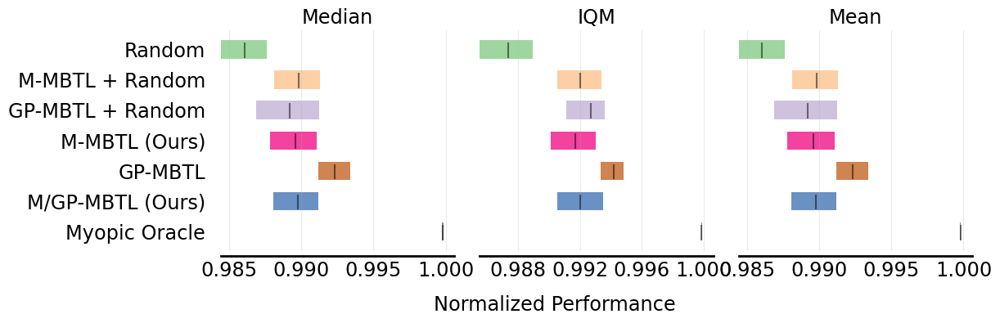

In [25]:
K=12
data_path=f"results/cartpole_boot_new_{15}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func, reps=500)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

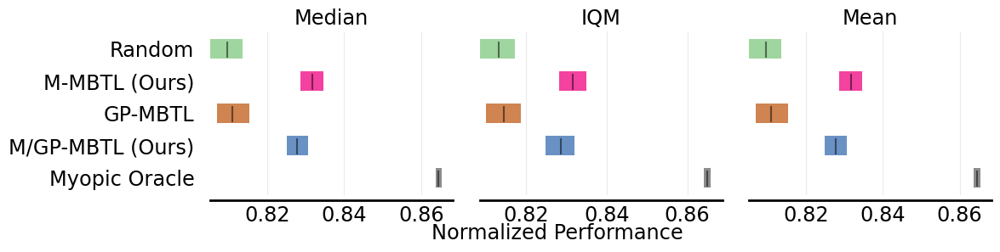

In [26]:
K=12
data_path=f"results/walker_boot_new_{15}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func,reps=500)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

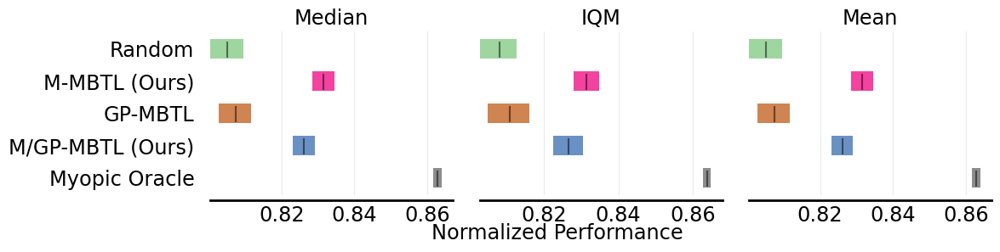

In [27]:
K=12
data_path=f"results/walker_boot_new_{15}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

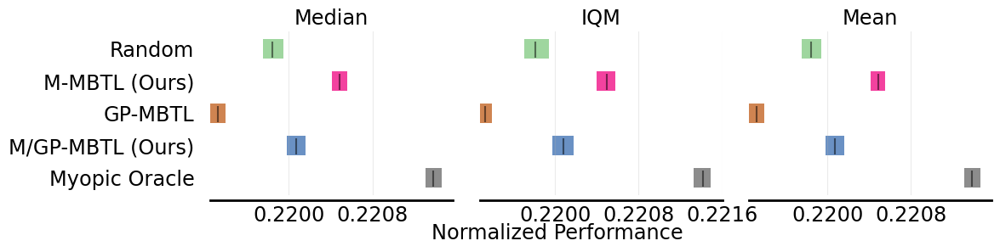

In [28]:
# K=216
K=50
# data_path=f"results/crop_boot_{K}_slope=0.01.npz"
data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
# alg_list = name_plot.keys() - ["independent_training", "multi_task", "stochastic_oracle"]
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data["stochastic_oracle"]).mean(axis=1)[:, np.newaxis] - np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func, reps=500)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  max_ticks=3,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

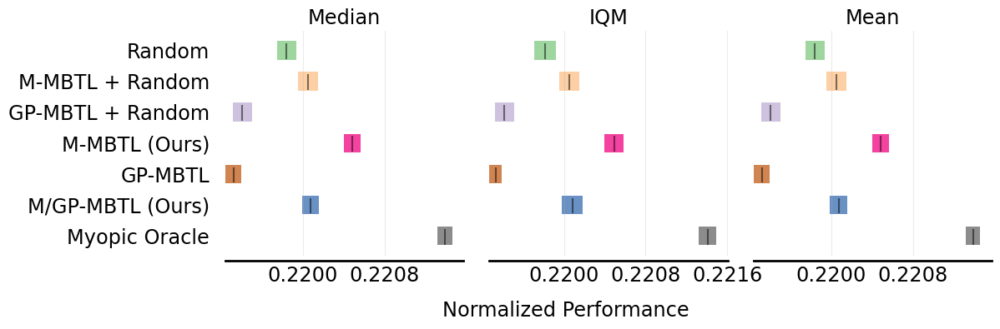

In [29]:
K=50
# data_path=f"results/crop_boot_{K}_slope=0.01.npz"
data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
# alg_list = name_plot.keys() - ["independent_training", "multi_task", "stochastic_oracle"]
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data["stochastic_oracle"]).mean(axis=1)[:, np.newaxis] - np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  max_ticks=3,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

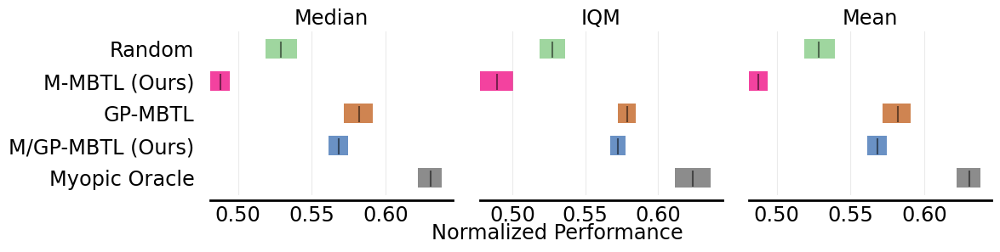

In [30]:
K=50
# K=216
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func, reps=500)
fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

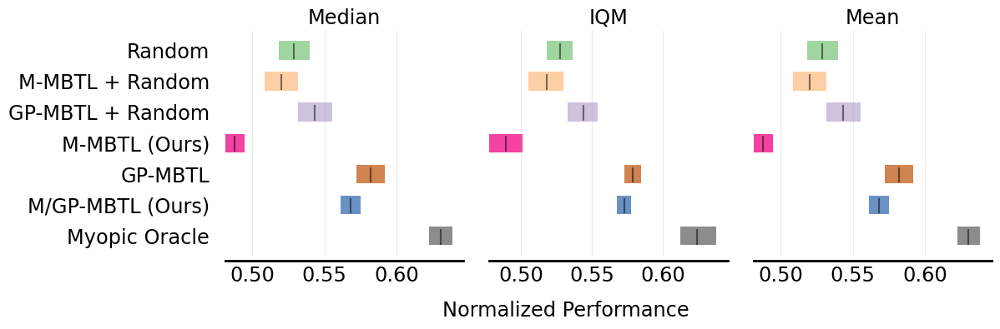

In [31]:
K=50
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

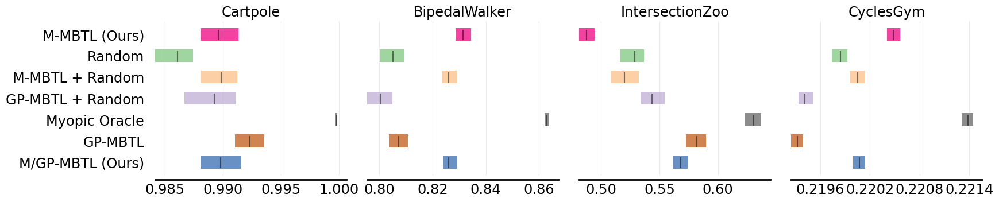

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rliable import library as rly
from rliable import metrics
from rliable import plot_utils

def aggregate_func(x):
    return np.array([metrics.aggregate_mean(x)])

task_names = ['Cartpole', 'BipedalWalker', 'IntersectionZoo', 'CyclesGym']
task_paths = [
    f"results/cartpole_boot_new_15_slope=0.01.npz",
    f"results/walker_boot_new_50_slope=0.01.npz",
    
    f"results/intersectionZoo_boot_new_50_slope=0.01.npz",
    f"results/crop_boot_new_50_slope=0.01.npz"
]
K_list = [12, 12, 50, 50]

# Final structure: {alg_name: [task1_mean, task2_mean, task3_mean, task4_mean]}
point_estimates = {}
interval_estimates = {}

alg_list = sorted(ablation_name_plot.keys() - ["independent_training", "multi_task"])
alg_plot_names = [ablation_name_plot[alg] for alg in alg_list]

for task_idx, (task_path, K) in enumerate(zip(task_paths, K_list)):
    perf_data = np.load(task_path, allow_pickle=True)["arr_0"].item()
    dict_result = {}
    for alg_name in alg_list:
        alg_display_name = ablation_name_plot[alg_name]
        scores = np.array(perf_data[alg_name])[:, K-1][:, np.newaxis]
        dict_result[alg_display_name] = scores

    task_scores, task_cis = rly.get_interval_estimates(dict_result, aggregate_func, reps=100)

    # Append results
    for alg in alg_plot_names:
        if alg not in point_estimates:
            point_estimates[alg] = []
            interval_estimates[alg] = []
        point_estimates[alg].append(task_scores[alg][0])
        interval_estimates[alg].append(task_cis[alg][:, 0])

# Convert lists to arrays of shape (num_tasks,)
for alg in point_estimates:
    point_estimates[alg] = np.array(point_estimates[alg])
    interval_estimates[alg] = np.array(interval_estimates[alg]).T
# Plot all 4 tasks in one figure
fig, axes = plot_utils.plot_interval_estimates(
    point_estimates,
    interval_estimates,
    metric_names=task_names,  # one subplot per task
    algorithms=alg_plot_names,
    colors=color_real,
    row_height=0.5,
    xlabel=None,
    subfigure_width=4.0
)
plt.show()


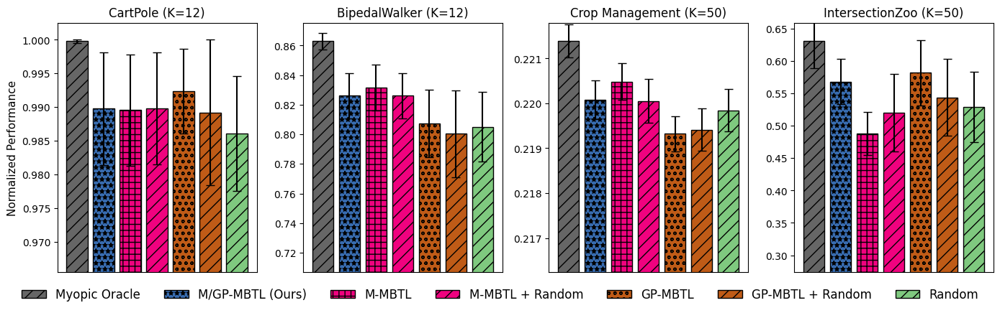

In [33]:
K = 50
K_list = [15, 50, 50, 50]
real_K_list = [12, 12, 50, 50]
name_list = ["cartpole", "walker", "crop", "intersectionZoo"]
name_dict = {
    "cartpole": "CartPole",
    "walker": "BipedalWalker",
    "crop": "Crop Management",
    "intersectionZoo": "IntersectionZoo",
}
ablation_name_plot = {
    "myopic_oracle": "Myopic Oracle",
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    "without_learning_weight": "M-MBTL",
    "random_mountain": "M-MBTL + Random",
    "MBTL": "GP-MBTL",
    "random_GP": "GP-MBTL + Random",
    "random_select": "Random",
}
hatches = {
    "M/GP-MBTL (Ours)": "*",
    "Random":      "/",
    "M-MBTL": "+",
    "Stochastic Oracle":  "/",
    "GP-MBTL":               "o",
    "Myopic Oracle":      "/",
    "M-MBTL + Random": "/",
    "GP-MBTL + Random": "/",
    "Independent Training": "/",
}
color_ablation = {
    "M/GP-MBTL (Ours)": cmap[4],
    "Random":      cmap[0],
    "M-MBTL": cmap[5],
    "Stochastic Oracle":  cmap[3],
    "GP-MBTL":               cmap[6],
    "Myopic Oracle":      cmap[7],
    "M-MBTL + Random": cmap[5],
    "GP-MBTL + Random": cmap[6],
    "Independent Training": cmap[2],
}

alg_keys = [k for k in ablation_name_plot if k != "multi_task"]
alg_labels = [ablation_name_plot[k] for k in alg_keys]
n_datasets = len(name_list)
n_algs     = len(alg_labels)

# accumulate means & stds
means = {lab: [] for lab in alg_labels}
stds  = {lab: [] for lab in alg_labels}

for name in name_list:
    K = K_list[name_list.index(name)]
    perf = np.load(f"results/{name}_boot_new_{K}_slope=0.01.npz", allow_pickle=True)["arr_0"].item()
    for k, lab in zip(alg_keys, alg_labels):
        real_K = real_K_list[name_list.index(name)]
        arr = np.array(perf[k])[:, real_K-1]      # final-round accuracies
        means[lab].append(arr.mean())
        stds [lab].append(arr.std())

# plot
x     = np.arange(n_datasets)
width = 0.8 / n_algs   # total group width = 0.8


fig, axs = plt.subplots(1, 4, figsize=(14, 4), sharex=False, sharey=False)

x     = np.arange(n_algs)
width = 0.8

for idx, (name, K) in enumerate(zip(name_list, K_list)):
    real_K = real_K_list[name_list.index(name)]
    ax = axs[idx]
    # plot each algorithm as a single bar (we already have one mean per alg per dataset)
    for i, lab in enumerate(alg_labels):
        m = means[lab][idx]
        s = stds[lab][idx]
        ax.bar(
            i, m,
            yerr=s,
            capsize=4,
            color=color_ablation[lab],
            hatch=hatches[lab]*2,
            edgecolor='black',
            width=0.8
        )

    # auto‐set y‐limits to zoom around the data
    all_vals = [means[lab][idx] for lab in alg_labels]
    y_min, y_max = min(all_vals), max(all_vals)
    margin = (y_max - y_min) * 0.1
    ax.set_ylim(y_min - margin*15, y_max + margin*2)

    # ax.set_xticks(x)
    # ax.set_xticklabels(alg_labels, rotation=45, ha='right', fontsize=9)
    # remove x-ticks
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_title(f"{name_dict[name]} (K={real_K})", fontsize=12)
    if idx == 0:
        ax.set_ylabel("Normalized Performance", fontsize=11)

# one legend for all
fig.legend(
    alg_labels,
    loc='lower center',
    ncol=min(n_algs, 7),
    frameon=False,
    fontsize=12,
    bbox_to_anchor=(0.5, -0.10)
)

# plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.tight_layout()
plt.savefig("figures/ablation_study.png", dpi=300)
plt.show()



## Epsilon suboptimality

In [34]:
# alg_list = ["stochastic_oracle", "random_select", "MBTL", "without_learning_weight", "Combined_alg", "Combined_alg_new", "Combined_alg_mountain"]
# alg_list = ["myopic_oracle", "stochastic_oracle", "random_select", "MBTL", "without_learning_weight", "Combined_alg_mountain", "random_GP", "random_mountain"]
alg_list = ["myopic_oracle", "random_select", "MBTL", "without_learning_weight", "Combined_alg_mountain"]
ablation_alg_list = ["myopic_oracle", "random_select", "MBTL", "without_learning_weight", "Combined_alg_mountain", "random_GP", "random_mountain"]
name_plot = {
    "Combined_alg_mountain": "M/GP-MBTL (Ours)",
    # "Combined_alg_new": "Hybrid-MBTL-new (Ours)",
    # "Combined_alg": "Hybrid-MBTL (Ours)",
    "MBTL": "GP-MBTL",
    "without_learning_weight": "M-MBTL (Ours)",
    "random_select": "Random",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
}


# Use Matplotlib's built-in 'tab10' color palette
# cmap = plt.get_cmap('Paired').colors
cmap = plt.get_cmap('Accent').colors

# Map your algorithms to colors from the tab10 palette
color = {
    "Combined_alg_mountain": cmap[4],
    # "Combined_alg_new": cmap[3],
    # "Combined_alg":       cmap[3],
    "multi_task":         cmap[1],
    "random_select":      cmap[0],
    "without_learning_weight": cmap[5],
    "independent_training":    cmap[2],
    "stochastic_oracle":  cmap[3],
    "MBTL":               cmap[6],
    "myopic_oracle":      cmap[7],
    "random_mountain":    cmap[2],
    "random_GP":         cmap[1],
}

markers = {
    "Combined_alg_mountain": "o",
    "random_select":      "s",
    "without_learning_weight": "D",
    "MBTL":               "^",
    "myopic_oracle":      "v",
    "random_mountain":    "<",
    "random_GP":         ">",
    
}

N_trials = 100

In [35]:
def interquartile_mean(k_list):
    sorted_k = np.sort(np.array(k_list))
    
    n = len(sorted_k)
    q25 = np.percentile(sorted_k, 25)
    q75 = np.percentile(sorted_k, 75)
    
    # Compute the interquartile mean (IQM) as the mean of the middle 50% of values.
    lower_idx = int(np.floor(0.25 * n))
    upper_idx = int(np.ceil(0.75 * n))
    iqm = np.mean(sorted_k[lower_idx:upper_idx])
    
    lower_error = iqm - q25
    upper_error = q75 - iqm
    return iqm, lower_error, upper_error

In [36]:
def plot_suboptimality(name, K, epsilon_list, legend=False, title=False, y_label=False):
    if "synt" in name:
        data_path = f"results/{name}_new_{K}_slope=0.01.npz"
    else:
        data_path = f"results/{name}_boot_new_{K}_slope=0.01.npz"
    perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

    min_value = np.inf
    max_value = -np.inf
    # Assume that we already know the max and min value of the environment
    if "synt" in name:
        N_trials_real = 0
        N_trials_boot = 100
        N_trials_tmp = 100
    else:
        N_trials_real = 3
        N_trials_boot = 100
        N_trials_tmp = 3
    for trial in range(N_trials_tmp):
        if name == "cartpole":
            matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
        elif name == "walker":
            matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
        elif name == "intersectionZoo":
            matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
        elif name == "crop":
            matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
        elif "syn" in name:
            matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
        matrix = np.load(matrix_path)
        max_value_trial = np.max(matrix)
        min_value_trial = np.min(matrix)
        max_value = np.maximum(max_value, max_value_trial)
        min_value = np.minimum(min_value, min_value_trial)

    oracle_transfer = []
    for trial in range(N_trials_real, N_trials_real+N_trials_boot):
        if name == "cartpole":
            matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
        elif name == "walker":
            matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
        elif name == "intersectionZoo":
            matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
        elif name == "crop":
            matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
        elif "syn" in name:
            matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
        matrix = np.load(matrix_path)
        matrix = (matrix - min_value) / (max_value - min_value)
        oracle_transfer.append(np.max(matrix, axis=0).mean())
    oracle_transfer = np.array(oracle_transfer)

    alg_data = {
        alg_name: {"y": [], "x_iqm": [], "x_low": [], "x_high": []}
        for alg_name in alg_list
    }

    plt.figure(figsize=(8, 6))
    for epsilon in epsilon_list:
        k_epsilon = {}

        for alg_name in alg_list:
            result_tmp = np.array(perf_data[alg_name])
            k_list = []
            for trial in range(N_trials):
                k_candidate = np.where(
                    result_tmp[trial] >= (1 - epsilon) * oracle_transfer[trial]
                )[0]
                k = k_candidate[0] if len(k_candidate) > 0 else K
                k_list.append(int(k))
            iqm, lower_error, upper_error = interquartile_mean(k_list)
            k_epsilon[alg_name] = [iqm, lower_error, upper_error]

        # Store the (epsilon, mean_k, std_k) in alg_data
        for i, alg_name in enumerate(alg_list):
            y_val = epsilon # -0.001*(i-len(alg_list)/2)
            x_iqm = k_epsilon[alg_name][0]
            x_low = k_epsilon[alg_name][1]
            x_high = k_epsilon[alg_name][2]

            alg_data[alg_name]["y"].append(y_val)
            alg_data[alg_name]["x_iqm"].append(x_iqm)
            alg_data[alg_name]["x_low"].append(x_low)
            alg_data[alg_name]["x_high"].append(x_high)

    for alg_name in alg_list:
        plt.errorbar(
            alg_data[alg_name]["x_iqm"],     # x-values = mean(K)
            alg_data[alg_name]["y"],         # y-values = epsilon
            xerr=[alg_data[alg_name]["x_low"], alg_data[alg_name]["x_high"]],  # horizontal error bars using low and high values
            fmt='--' if alg_name!="myopic_oracle" else "-",
            marker=markers[alg_name],
            linewidth=5,
            alpha=0.8,
            label=name_plot[alg_name],
            color=color[alg_name],
        )

    plt.gca().invert_yaxis()

    plt.xlabel("Decision round", fontsize=27)         # K is now the horizontal axis
    if y_label:
        plt.ylabel("Suboptimality gap", fontsize=27)   # epsilon is now the vertical axis
    if legend:
        plt.legend(fontsize=27, loc='lower right')
    # axis font size
    # plt.ylim(top=-0.002)
    plt.xticks(fontsize=27)
    plt.yticks(fontsize=27)
    # plt.xscale("log")
    plt.grid(True, linestyle='--', linewidth=0.5)
    # plt.title("BipedalWalker")
    if title:
        plt.title(name)
    plt.savefig(f"figures/epsilon_suboptimal_{name}_K{K}.png", format="png", dpi=300, bbox_inches='tight')

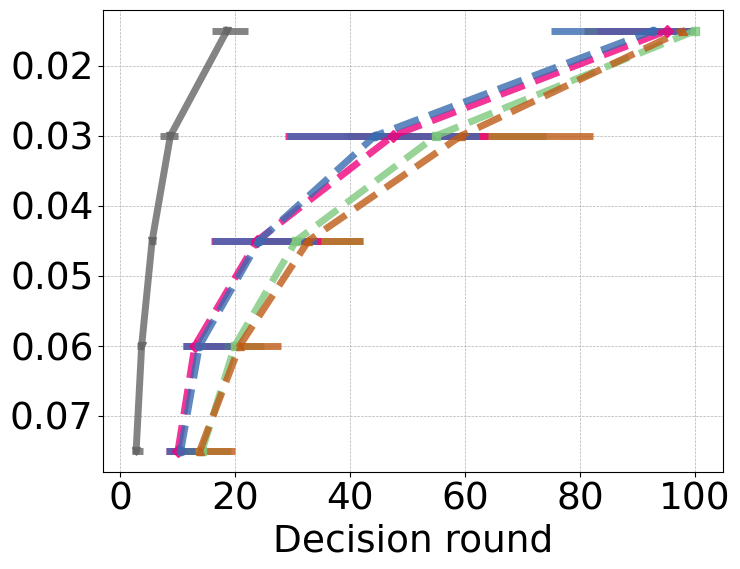

In [37]:
name = "walker"
K = 100
epsilon_list = [0.075, 0.06, 0.045, 0.03, 0.015]
plot_suboptimality(name, K, epsilon_list)

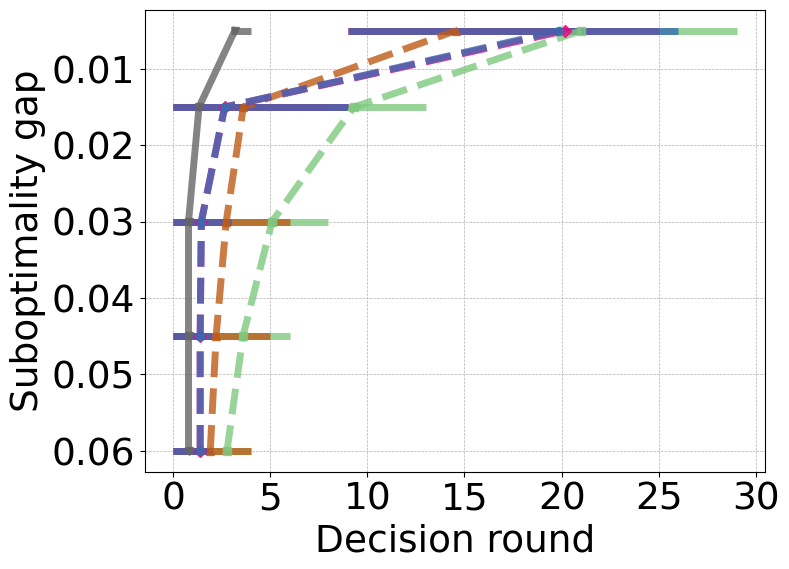

In [38]:
name = "cartpole"
K = 40
epsilon_list = [0.06, 0.045, 0.03, 0.015, 0.005]
plot_suboptimality(name, K, epsilon_list, y_label=True)

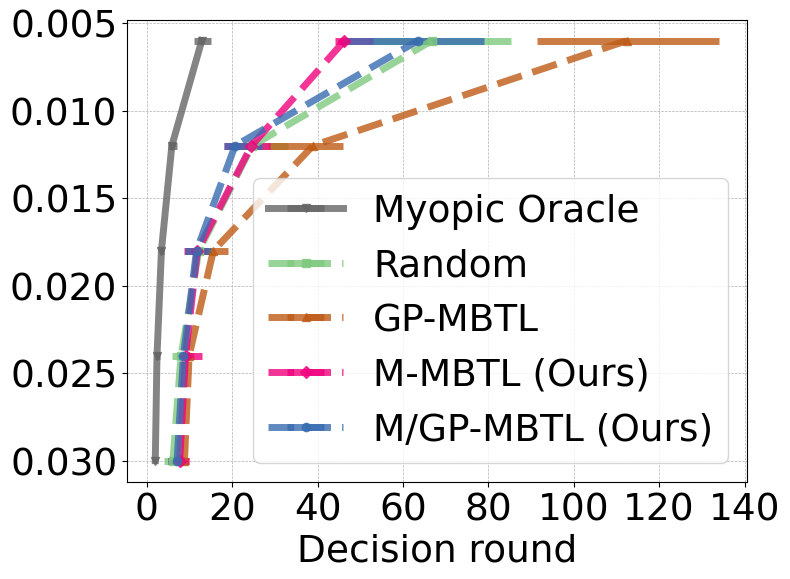

In [39]:
name = "crop"
K = 200
epsilon_list = [0.03, 0.024, 0.018, 0.012, 0.006]
plot_suboptimality(name, K, epsilon_list, legend=True)

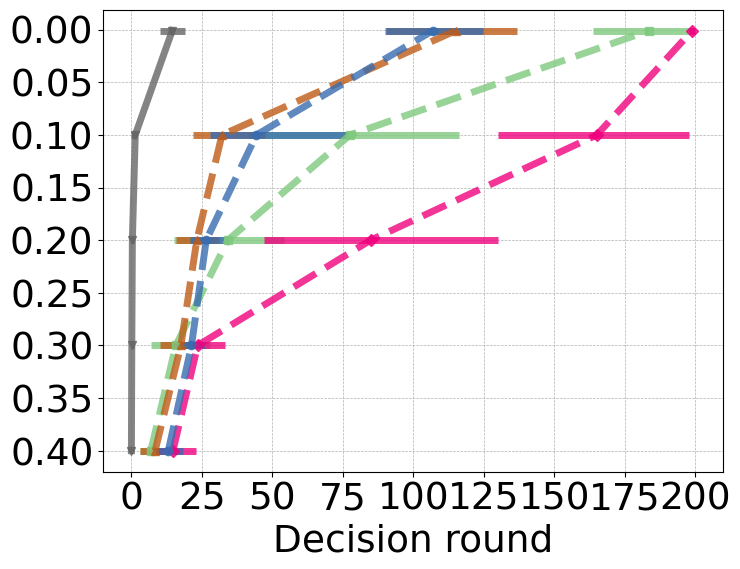

In [40]:
name = "intersectionZoo"
K = 200
epsilon_list = [0.4, 0.3, 0.2, 0.1, 0.001]
plot_suboptimality(name, K, epsilon_list)


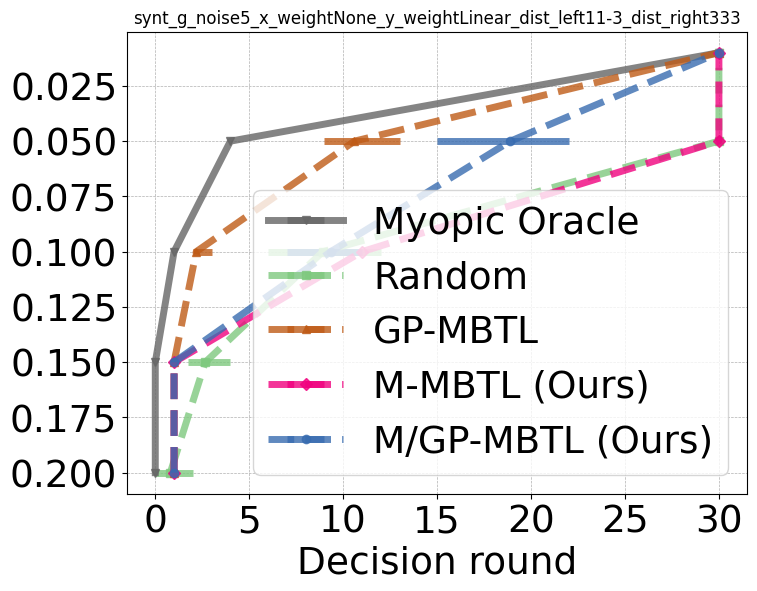

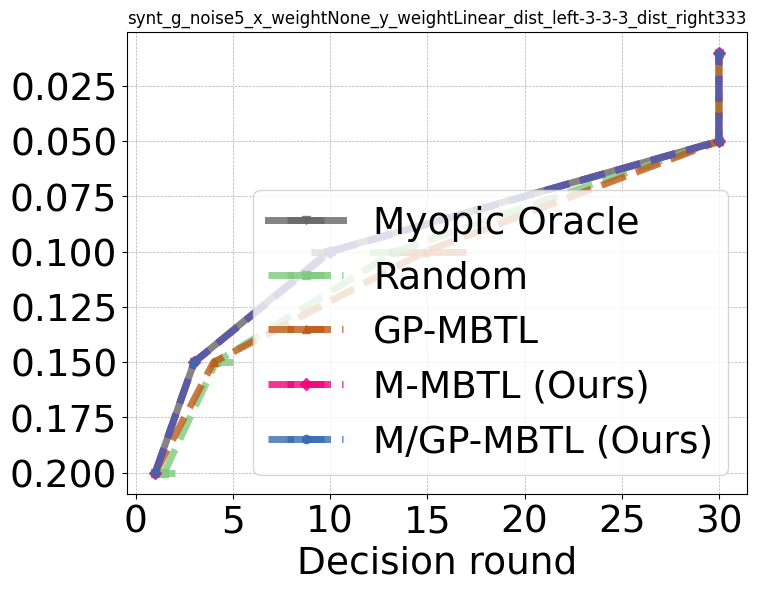

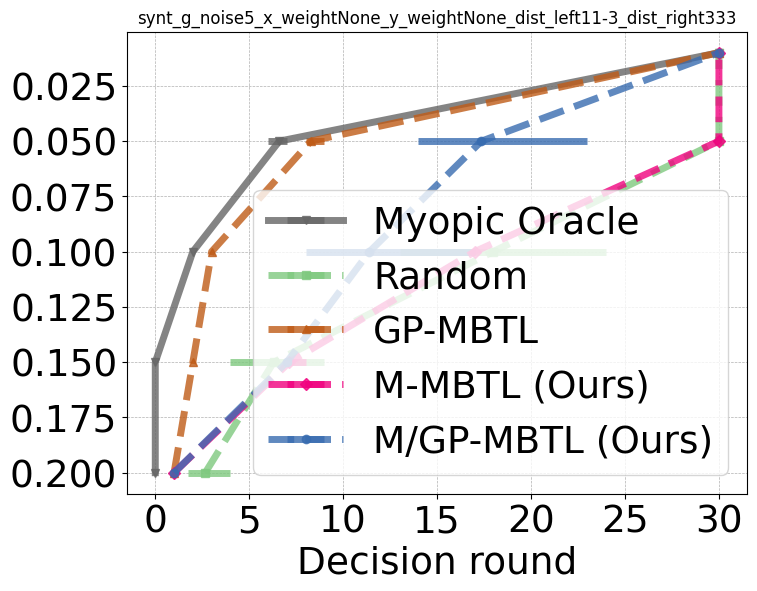

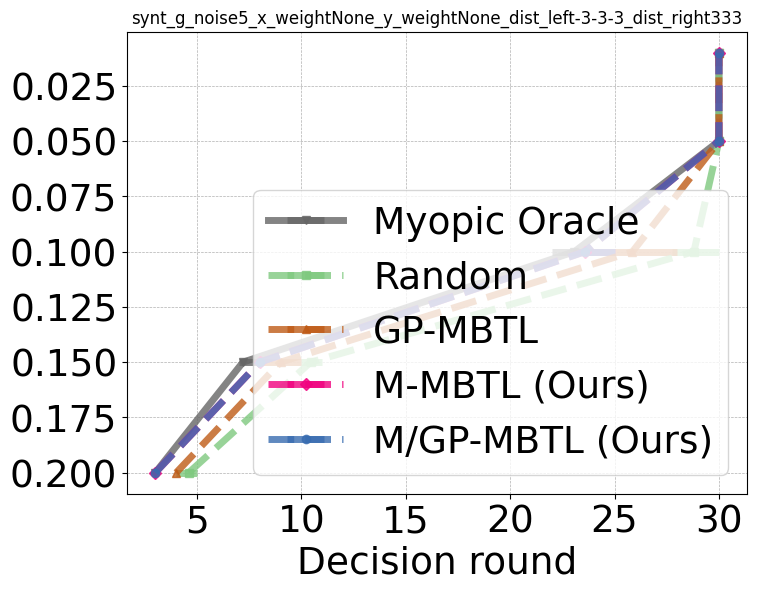

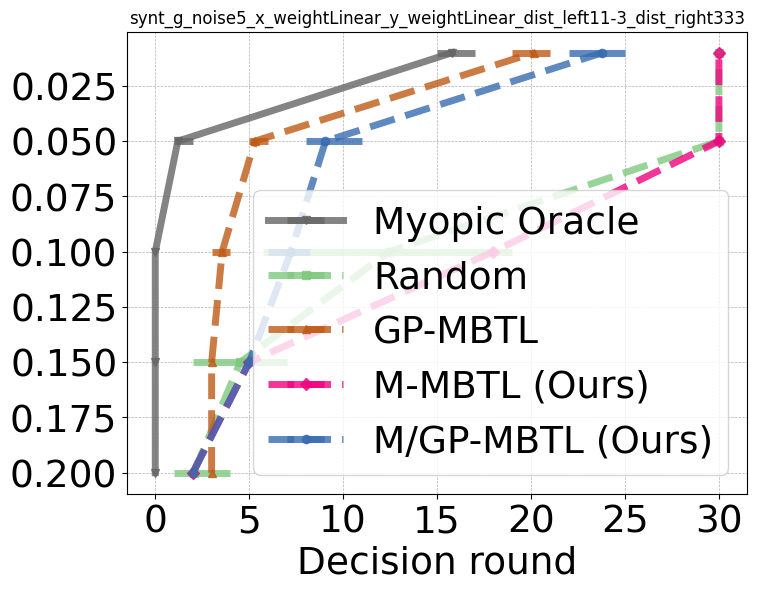

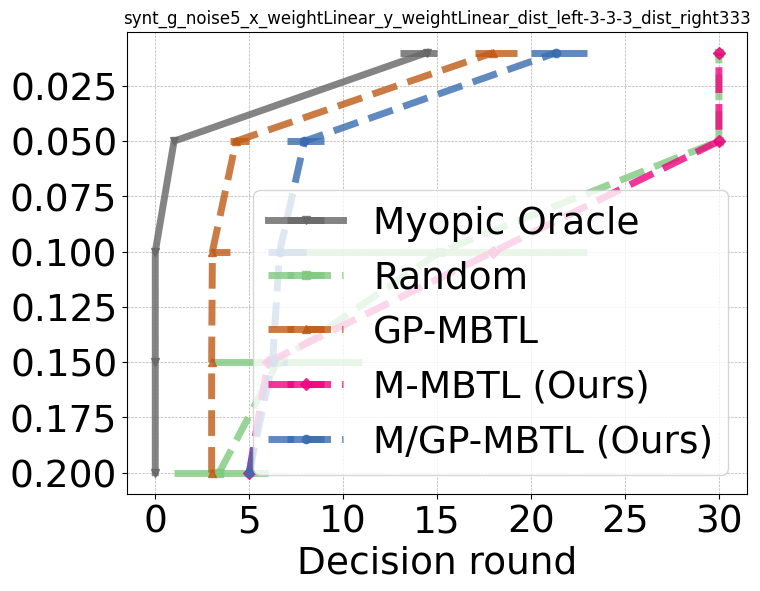

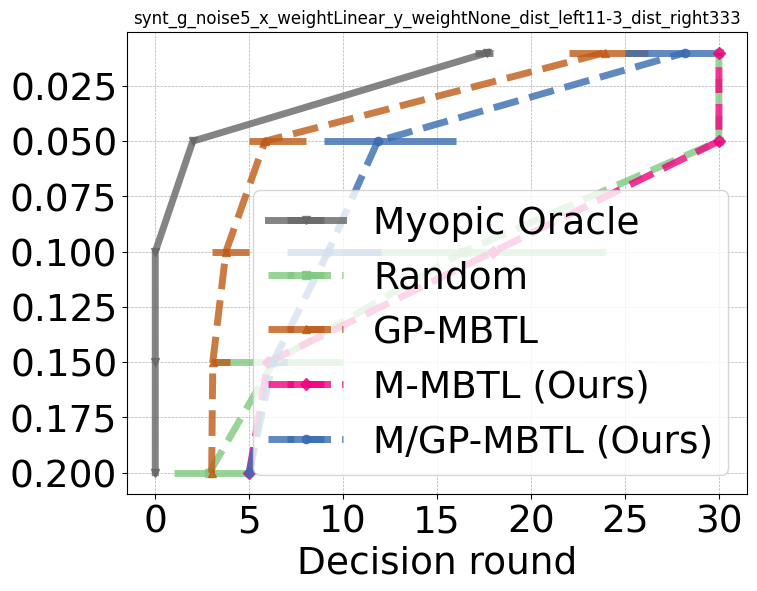

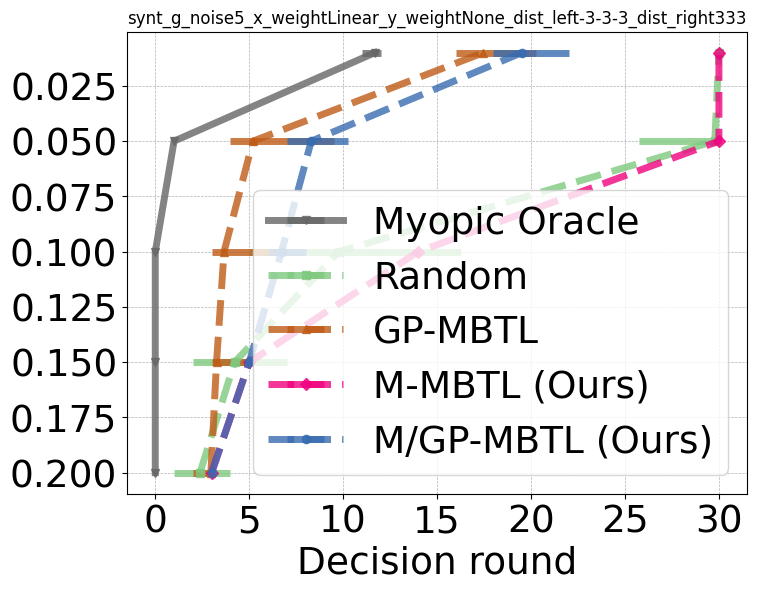

In [41]:
data_name = "synt_g"
# x_weight_list=[None, "333"]
# y_weight_list=[None, "333"]
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
for x_weight in x_weight_list:
    for y_weight in y_weight_list:
        for left_weight in dist_left_list:
            try:
                name = f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
                # if x_weight is None:
                #     K = 15
                #     epsilon_list = [0.4, 0.3, 0.2, 0.15, 0.1, 0.05, 0.01]
                # else:
                #     K = 30
                #     epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]
                K = 30
                epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]

                plot_suboptimality(name, K, epsilon_list, legend=True, title=True)
            except:
                print(f"File not found: {name}")
                continue

## Algorithm Switch

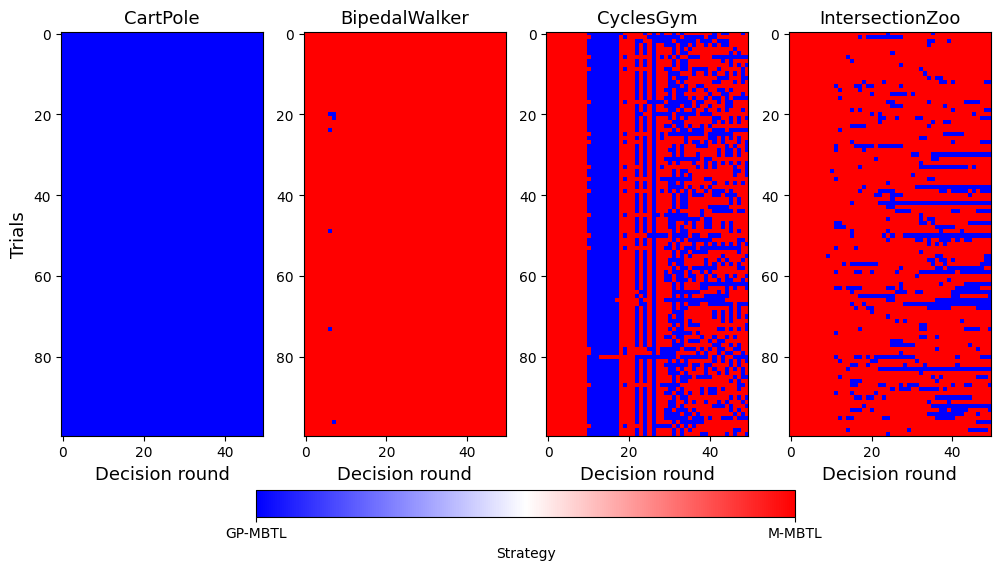

In [42]:
K = 50
name_list = ["cartpole", "walker", "crop", "intersectionZoo"]
name_dict = {
    "cartpole": "CartPole",
    "walker": "BipedalWalker",
    "crop": "CyclesGym",
    "intersectionZoo": "IntersectionZoo",
}
# four subplots
fig, axs = plt.subplots(1, 4, figsize=(12, 7))
for name_idx, name in enumerate(name_list):
    im = axs[name_idx].imshow(np.load(f"results/{name}_boot_algswitch_{K}_slope=0.01.npy").astype(int), cmap='bwr', interpolation='nearest')
    axs[name_idx].set_xlabel('Decision round', fontsize=13)
    if name_idx==0:
        axs[name_idx].set_ylabel('Trials', fontsize=13)
    axs[name_idx].set_title(f"{name_dict[name]}", fontsize=13)

cbar = fig.colorbar(
    im,                # the mappable we saved
    ax=axs,                 # apply to all subplots
    orientation='horizontal',
    fraction=0.05,          # height of the colorbar as fraction of the figure
    pad=0.1,                # space between the subplots and the colorbar
    ticks=[0, 1],
    label='Strategy'
)
cbar.set_ticklabels(['GP-MBTL', 'M-MBTL'])
plt.savefig(f"figures/algswitch_benchmarks_K{K}.png", format="png", dpi=300, bbox_inches='tight')
plt.show()

## Tables

In [43]:
name_plot

{'Combined_alg_mountain': 'M/GP-MBTL (Ours)',
 'MBTL': 'GP-MBTL',
 'without_learning_weight': 'M-MBTL (Ours)',
 'random_select': 'Random',
 'myopic_oracle': 'Myopic Oracle',
 'random_mountain': 'M-MBTL + Random',
 'random_GP': 'GP-MBTL + Random'}

In [44]:
K_cartpole = 12
K_walker = 12
K_zoo = 50
K_crop = 50
aggregate_results = pd.DataFrame()
name_plot["independent_training"]="Independent Training"
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
    if name in ["cartpole"]:
        K=K_cartpole
    elif name in ["walker"]:
        K=K_walker
    elif name in ["intersectionZoo"]:
        K=K_zoo
    elif name in ["crop"]:
        K=K_crop
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task', "random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
GP-MBTL,0.991927,0.006932,0.807346,0.022940,0.219325,0.000392,0.584024,0.047910
M-MBTL (Ours),0.989597,0.008298,0.831532,0.015491,0.220486,0.000414,0.487768,0.033782
M/GP-MBTL (Ours),0.989788,0.008387,0.826082,0.015305,0.220075,0.000432,0.568208,0.035309
Random,0.986072,0.008573,0.805111,0.023429,0.219843,0.000474,0.528751,0.054688
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
Myopic Oracle,0.999781,0.000258,0.862894,0.005522,0.221384,0.000370,0.630541,0.041931


In [45]:
# add multitask performance row to the bottom of the table
aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'crop_mean'] = np.mean(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'crop_std'] = np.std(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'intersectionZoo_mean'] = np.mean(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'intersectionZoo_std'] = np.std(multi_task_performance_intersectionzoo)
aggregate_results


,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
GP-MBTL,0.991927,0.006932,0.807346,0.022940,0.219325,0.000392,0.584024,0.047910
M-MBTL (Ours),0.989597,0.008298,0.831532,0.015491,0.220486,0.000414,0.487768,0.033782
M/GP-MBTL (Ours),0.989788,0.008387,0.826082,0.015305,0.220075,0.000432,0.568208,0.035309
Random,0.986072,0.008573,0.805111,0.023429,0.219843,0.000474,0.528751,0.054688
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
Myopic Oracle,0.999781,0.000258,0.862894,0.005522,0.221384,0.000370,0.630541,0.041931
Multi-task,0.996685,0.002150,0.567995,0.083659,0.208063,0.000202,0.378822,0.087337


In [46]:

df = aggregate_results
random_means = df.loc['Random']
oracle_means = df.loc['Myopic Oracle']
normalized_df = (df - random_means) / (oracle_means - random_means)

algs = ["M-MBTL (Ours)",
        "Independent Training",
        "M/GP-MBTL (Ours)",
        "GP-MBTL",
        "Multi-task"]

benchmarks = ["cartpole", "walker", "crop", "intersectionZoo"]

data = {
    alg: np.mean([normalized_df[f"{bm}_mean"][alg] for bm in benchmarks])
    for alg in algs
}

aggregated_metric = pd.DataFrame([data], index=["Aggregated Performance"])
display(aggregated_metric)

,M-MBTL (Ours),Independent Training,M/GP-MBTL (Ours),GP-MBTL,Multi-task
Aggregated Performance,0.182199,-2.906288,0.293047,0.168082,-3.111961


In [47]:
df = aggregate_results

# Compute the mean values for Random and Myopic Oracle
random_means = df.loc['Random']
oracle_means = df.loc['Myopic Oracle']

# Normalize via (value - random) / (oracle - random)
normalized_df = (df - random_means) / (oracle_means - random_means)
normalized_df

,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
GP-MBTL,0.427089,0.197293,0.038689,0.027300,-0.336459,0.794711,0.543009,0.531377
M-MBTL (Ours),0.257161,0.033076,0.457240,0.443254,0.417030,0.583169,-0.402635,1.638810
M/GP-MBTL (Ours),0.271100,0.022416,0.362933,0.453663,0.150526,0.400537,0.387631,1.519065
Random,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000
Independent Training,-3.756539,0.835027,-0.444691,1.002543,-4.238324,-3.017395,-3.185599,3.974230
Myopic Oracle,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Multi-task,0.774183,0.772486,-4.103541,-3.363662,-7.645542,2.623166,-1.472945,-2.559233


In [48]:
# Aggregated metric

def CI(arr, reps=3000):
    """
    input: arr (np.ndarray) - shape: (num_runs, num_tasks) or (num_runs,)
    output: CI
    """
    if arr.ndim == 1:
        arr = arr[:, np.newaxis]
    score_dict = {'data': arr}
    func = lambda x: np.array([np.mean(x)])
    _, interval_estimates = rly.get_interval_estimates(
        score_dict,
        func=func,
        reps=reps,
    )
    lower, upper = interval_estimates['data'][:, 0]
    return lower, upper

K_cartpole = 12
K_walker = 12
K_zoo = 50
K_crop = 50
perf_dict = {}

name_plot["independent_training"]="Independent Training"
multi_task_perf_arr = np.zeros((0,))
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
    if name in ["cartpole"]:
        K=K_cartpole
    elif name in ["walker"]:
        K=K_walker
    elif name in ["intersectionZoo"]:
        K=K_zoo
    elif name in ["crop"]:
        K=K_crop
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ["random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in name_plot.keys() - ["random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
    if name == "cartpole":
        multi_task_perf = (eval(f"multi_task_performance_{name}")[-1]).copy()
    elif name == "intersectionZoo":
        multi_task_perf = (eval("multi_task_performance_"+"intersectionzoo")).copy()
    else:
        multi_task_perf = (eval(f"multi_task_performance_{name}")).copy()
    multi_task_perf -= mean_random
    multi_task_perf /= mean_oracle - mean_random
    multi_task_perf_arr = np.concatenate([multi_task_perf_arr, np.array(multi_task_perf)])
# aggregate_results = aggregate_results.drop(index=['Random', 'Myopic Oracle']) 

perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T

perf_df = perf_df.round(4)
perf_df.loc["Multi-task", "mean"] = multi_task_perf_arr.mean()
perf_df.loc["Multi-task", "std"] = multi_task_perf_arr.std()
perf_df.loc["Multi-task", "upper"] = CI(multi_task_perf_arr)[1]
perf_df.loc["Multi-task", "lower"] = CI(multi_task_perf_arr)[0]
display(perf_df)

,mean,std,upper,lower
GP-MBTL,0.168100,0.541200,0.223200,0.116900
M-MBTL (Ours),0.182200,0.522700,0.232400,0.131800
M/GP-MBTL (Ours),0.293000,0.409800,0.331700,0.253900
Random,0.000000,0.482000,0.046600,-0.049500
Independent Training,-2.906300,1.493100,-2.763000,-3.050900
Myopic Oracle,1.000000,0.242200,1.024400,0.975700
Multi-task,-3.111961,3.248048,-1.297596,-4.982961


In [49]:
pd.set_option('display.float_format', '{:.4f}'.format) 
aggregate_results

,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
GP-MBTL,0.9919,0.0069,0.8073,0.0229,0.2193,0.0004,0.5840,0.0479
M-MBTL (Ours),0.9896,0.0083,0.8315,0.0155,0.2205,0.0004,0.4878,0.0338
M/GP-MBTL (Ours),0.9898,0.0084,0.8261,0.0153,0.2201,0.0004,0.5682,0.0353
Random,0.9861,0.0086,0.8051,0.0234,0.2198,0.0005,0.5288,0.0547
Independent Training,0.9346,0.0016,0.7794,0.0055,0.2133,0.0008,0.2045,0.0040
Myopic Oracle,0.9998,0.0003,0.8629,0.0055,0.2214,0.0004,0.6305,0.0419
Multi-task,0.9967,0.0021,0.5680,0.0837,0.2081,0.0002,0.3788,0.0873


## Table with CI

In [50]:
import numpy as np
from scipy import stats

In [51]:
def CI(arr, reps=3000):
    """
    input: arr (np.ndarray) - shape: (num_runs, num_tasks) or (num_runs,)
    output: CI
    """
    if arr.ndim == 1:
        arr = arr[:, np.newaxis]
    score_dict = {'data': arr}
    func = lambda x: np.array([np.mean(x)])
    _, interval_estimates = rly.get_interval_estimates(
        score_dict,
        func=func,
        reps=reps,
    )
    lower, upper = interval_estimates['data'][:, 0]
    return lower, upper

In [52]:
data_path=f"results/cartpole_boot_new_{100}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
dict_result["M-MBTL (Ours)"] = np.array(perf_data["without_learning_weight"])[:, 12-1][:, np.newaxis]
func = lambda x: np.array([np.mean(x)])
_, interval_estimates = rly.get_interval_estimates(
    dict_result,
    func=func,
    reps=3000,
)
print(interval_estimates)

{'M-MBTL (Ours)': array([[0.98785711],
       [0.9911173 ]])}


In [53]:
K_cartpole = 12
K_walker = 12
K_zoo = 50
K_crop = 50
aggregate_results = pd.DataFrame()
name_plot["independent_training"]="Independent Training"
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
    if name in ["cartpole"]:
        K=K_cartpole
    elif name in ["walker"]:
        K=K_walker
    elif name in ["intersectionZoo"]:
        K=K_zoo
    elif name in ["crop"]:
        K=K_crop
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task', "random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    aggregate_results[f"{name}_mean"] = df_result.mean()
    aggregate_results[f"{name}_std"] = df_result.std()
    aggregate_results[f"{name}_upper"] = df_result.apply(lambda col: CI(col.values)[1])
    aggregate_results[f"{name}_lower"] = df_result.apply(lambda col: CI(col.values)[0])
# add multitask performance row to the bottom of the table
aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'cartpole_upper'] = CI(multi_task_performance_cartpole[-1])[1]
aggregate_results.loc['Multi-task', 'cartpole_lower'] = CI(multi_task_performance_cartpole[-1])[0]
aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'walker_upper'] = CI(np.array(multi_task_performance_walker))[1]
aggregate_results.loc['Multi-task', 'walker_lower'] = CI(np.array(multi_task_performance_walker))[0]
aggregate_results.loc['Multi-task', 'crop_mean'] = np.mean(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'crop_std'] = np.std(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'crop_upper'] = CI(np.array(multi_task_performance_crop))[1]
aggregate_results.loc['Multi-task', 'crop_lower'] = CI(np.array(multi_task_performance_crop))[0]
aggregate_results.loc['Multi-task', 'intersectionZoo_mean'] = np.mean(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'intersectionZoo_std'] = np.std(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'intersectionZoo_upper'] = CI(np.array(multi_task_performance_intersectionzoo))[1]
aggregate_results.loc['Multi-task', 'intersectionZoo_lower'] = CI(np.array(multi_task_performance_intersectionzoo))[0]
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]
aggregate_results


,cartpole_mean,cartpole_std,cartpole_upper,cartpole_lower,walker_mean,walker_std,walker_upper,walker_lower,crop_mean,crop_std,crop_upper,crop_lower,intersectionZoo_mean,intersectionZoo_std,intersectionZoo_upper,intersectionZoo_lower,aggregated_mean,aggregated_std,aggregated_upper,aggregated_lower
GP-MBTL,0.9919,0.0069,0.9932,0.9905,0.8073,0.0229,0.8117,0.8026,0.2193,0.0004,0.2194,0.2192,0.5840,0.0479,0.5936,0.5749,0.1681,0.5412,0.2232,0.1169
M-MBTL (Ours),0.9896,0.0083,0.9911,0.9879,0.8315,0.0155,0.8345,0.8285,0.2205,0.0004,0.2206,0.2204,0.4878,0.0338,0.4944,0.4813,0.1822,0.5227,0.2324,0.1318
M/GP-MBTL (Ours),0.9898,0.0084,0.9913,0.9880,0.8261,0.0153,0.8290,0.8231,0.2201,0.0004,0.2202,0.2200,0.5682,0.0353,0.5751,0.5610,0.2930,0.4098,0.3317,0.2539
Random,0.9861,0.0086,0.9877,0.9843,0.8051,0.0234,0.8094,0.8006,0.2198,0.0005,0.2199,0.2198,0.5288,0.0547,0.5398,0.5184,0.0000,0.4820,0.0466,-0.0495
Independent Training,0.9346,0.0016,0.9349,0.9343,0.7794,0.0055,0.7805,0.7783,0.2133,0.0008,0.2135,0.2132,0.2045,0.0040,0.2053,0.2037,-2.9063,1.4931,-2.7630,-3.0509
Myopic Oracle,0.9998,0.0003,0.9998,0.9997,0.8629,0.0055,0.8640,0.8618,0.2214,0.0004,0.2215,0.2213,0.6305,0.0419,0.6387,0.6224,1.0000,0.2422,1.0244,0.9757
Multi-task,0.9967,0.0021,0.9997,0.9950,0.5680,0.0837,0.6338,0.4499,0.2081,0.0002,0.2083,0.2078,0.3788,0.0873,0.4935,0.2818,-3.1120,3.2480,-1.2976,-4.9830


In [54]:
import pandas as pd
df = aggregate_results.copy()
context_to_columns = {
    "CartPole": ("cartpole_mean", "cartpole_std", "cartpole_upper", "cartpole_lower"),
    "BipedalWalker": ("walker_mean", "walker_std", "walker_upper", "walker_lower"),
    "IntersectionZoo": ("intersectionZoo_mean", "intersectionZoo_std", "intersectionZoo_upper", "intersectionZoo_lower"),
    "CyclesGym": ("crop_mean", "crop_std", "crop_upper", "crop_lower")
}

context_to_k = {
    "CartPole": 12,
    "BipedalWalker": 12,
    "CyclesGym": 50,
    "IntersectionZoo": 50,
}

method_name_map = {
    "Independent Training": "Independent",
    "Multi-task":           "Multi-task",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL (Ours)":        "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":        "Myopic Oracle",
}

latex_method_order = [
    "Independent",
    "Multi-task",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

df.index = [method_name_map.get(m, m) for m in df.index]

def get_mean_std_upper_lower(row_label, context_name):
    mean_col, std_col, upper_col, lower_col = context_to_columns[context_name]
    return (df.loc[row_label, mean_col],
            df.loc[row_label, std_col],
            df.loc[row_label, upper_col],
            df.loc[row_label, lower_col])

def should_bold(upper, best_lower):
    return upper >= best_lower

# -------------------------------
# -------------------------------
latex_lines_ci = []

table_header_ci = r"""\begin{table*}[!ht]
    \begin{small}
\begin{center}
  \caption{Performance comparison of different methods on CMDP benchmarks}
  \label{tab:performance}
  \begin{tabular}{ccccccc|c}
    \toprule
    \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{Benchmark}\\\textbf{(CMDP)}\end{tabular}} & \multicolumn{1}{c}{\textbf{Independent}} & \multicolumn{1}{c}{\textbf{Multi-task}} & \multicolumn{1}{c}{\textbf{Random}} & \multicolumn{1}{c}{\textbf{GP-MBTL}} & \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{M-MBTL}\\\textbf{(Ours)}\end{tabular}} & \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{M/GP-MBTL}\\\textbf{(Ours)}\end{tabular}} & \multicolumn{1}{c}{\textbf{Myopic Oracle}} \\
    \midrule"""
table_footer = r"""    \end{tabular}
\end{center}
    \scriptsize{* \textit{Note}: Values are reported as the mean performance ± half the width of the 95\% confidence interval. Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle.\\}
\end{small}
\end{table*}
"""
latex_lines_ci.append(table_header_ci)

for context_name in context_to_columns.keys():
    row_data = {meth: get_mean_std_upper_lower(meth, context_name) for meth in latex_method_order}
    best_lower = max((v[3] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

    row_prefix = (r"\begin{tabular}[c]{@{}c@{}}\textbf{" + context_name + r"}\\($K=" + str(context_to_k[context_name]) + "$)\end{tabular}")
    row_cells = []
    for meth in latex_method_order:
        mean_val, std_val, upper_val, lower_val = row_data[meth]
        mean_str = f"{mean_val:.4f}"
        # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
        ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
        if meth != "Myopic Oracle" and should_bold(upper_val, best_lower):
            cell_str = r"\begin{tabular}[c]{@{}c@{}}\textbf{" + mean_str + r"}\\" + ci_str + r"\end{tabular}"
        else:
            cell_str = r"\begin{tabular}[c]{@{}c@{}}" + mean_str + r"\\" + ci_str + r"\end{tabular}"
        row_cells.append(cell_str)

    latex_lines_ci.append(row_prefix + " & " + " & ".join(row_cells) + r" \\")

latex_lines_ci.append(table_footer)

def get_aggregated_ci(row_label):
    return (
        df.loc[row_label, "aggregated_mean"],
        df.loc[row_label, "aggregated_lower"],
        df.loc[row_label, "aggregated_upper"],
    )

row_data = {meth: get_aggregated_ci(meth) for meth in latex_method_order}
best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

row_prefix = r"\midrule" + "\n" + r"\begin{tabular}[c]{@{}c@{}}\textbf{Aggregated}\\\textbf{Metric}\end{tabular}"
row_cells = []
for meth in latex_method_order:
    mean_val, lower_val, upper_val = row_data[meth]
    mean_str = f"{mean_val:.4f}"
    # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
    ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
    if meth != "Myopic Oracle" and upper_val >= best_lower:
        cell_str = r"\begin{tabular}[c]{@{}c@{}}\textbf{" + mean_str + r"}\\" + ci_str + r"\end{tabular}"
    else:
        cell_str = r"\begin{tabular}[c]{@{}c@{}}" + mean_str + r"\\" + ci_str + r"\end{tabular}"
    row_cells.append(cell_str)

# Insert into existing LaTeX content before footer
latex_lines_ci.insert(-1, row_prefix + " & " + " & ".join(row_cells) + r" \\")
latex_lines_ci.insert(-1, r"\bottomrule")

output_tex_path = "performance_table_with_CI.tex"
with open(output_tex_path, "w") as f:
    for line in latex_lines_ci:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex_path}")


LaTeX table written to performance_table_with_CI.tex


/tmp/ipykernel_925427/3516799924.py:11: DeprecationWarning: numpy.core is deprecated and has been renamed to numpy._core. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.multiarray.
  axis = np.core.multiarray.normalize_axis_index(axis, arr.ndim)


Combined_alg_mountain M/GP-MBTL (Ours)
MBTL GP-MBTL
without_learning_weight M-MBTL (Ours)
random_select Random
myopic_oracle Myopic Oracle
random_mountain M-MBTL + Random
random_GP GP-MBTL + Random
independent_training Independent Training


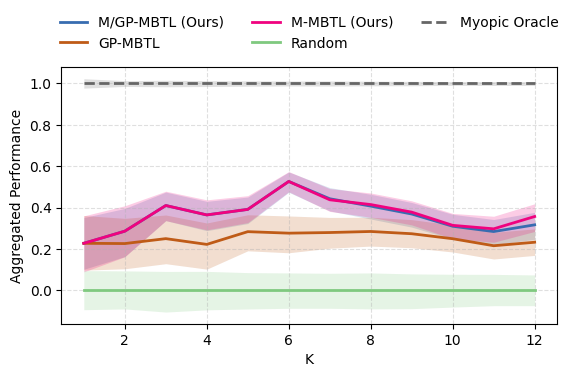

/tmp/ipykernel_925427/3516799924.py:11: DeprecationWarning: numpy.core is deprecated and has been renamed to numpy._core. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.multiarray.
  axis = np.core.multiarray.normalize_axis_index(axis, arr.ndim)


Combined_alg_mountain M/GP-MBTL (Ours)
MBTL GP-MBTL
without_learning_weight M-MBTL (Ours)
random_select Random
myopic_oracle Myopic Oracle
random_mountain M-MBTL + Random
random_GP GP-MBTL + Random
independent_training Independent Training


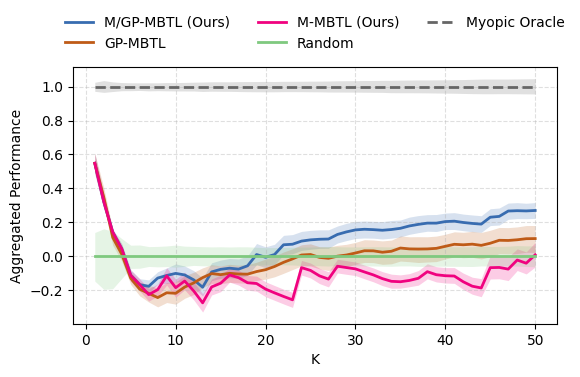

In [89]:
def CI_axis(arr, axis, reps=1000, ci=0.95, random_state=None):
    """
    arr : any object that can be converted to an ndarray
    axis : axis along which the CI is computed
    reps : number of bootstrap resamples
    ci : confidence level (default 95%)
    random_state : optional seed for reproducibility
    Returns (low, high), both shaped like arr with the given axis removed.
    """
    arr = np.asarray(arr, dtype=float)
    axis = np.core.multiarray.normalize_axis_index(axis, arr.ndim)
    arr = np.moveaxis(arr, axis, 0)       # move the target axis to the front for easier sampling
    n = arr.shape[0]

    rng = np.random.default_rng(random_state)
    boot = np.empty((reps,) + arr.shape[1:], dtype=float)
    for i in range(reps):
        idx = rng.integers(0, n, size=n)
        boot[i] = arr[idx].mean(axis=0)   # default to the sample mean; swap in median or another stat if needed

    alpha = 1 - ci
    low = np.quantile(boot, alpha / 2, axis=0)
    high = np.quantile(boot, 1 - alpha / 2, axis=0)
    return low, high

noise = 5
K_list = [12, 50]
names_list = [["cartpole", "walker"], ["intersectionZoo", "crop"]]
for i in range(len(names_list)):
    perf_dict = {}
    multi_task_perf_arr = np.zeros((0,))
    for name in names_list[i]:
        K = K_list[i]
        data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
        perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

        # ✅ Use a dict instead of a DataFrame
        df_result = {}
        algs = (name_plot.keys() - ['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"])

        for alg_name in algs:
            # perf_data[alg_name] should have shape [num_trials, K]
            df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,:K]

        # Both arrays have shape [1, K]
        mean_oracle = np.mean(df_result["Myopic Oracle"], axis=0, keepdims=True)
        mean_random = np.mean(df_result["Random"], axis=0, keepdims=True)

        for alg_name in algs:
            key = name_plot[alg_name]
            vals = df_result[key]

            # Normalize
            vals = vals - mean_random
            vals = vals / (mean_oracle - mean_random)

            # ✅ Safely accumulate into perf_dict
            if key not in perf_dict:
                perf_dict[key] = vals
            else:
                perf_dict[key] = np.concatenate([perf_dict[key], vals], axis=0)


    # No change needed for the CI_axis and perf_summary code below
    perf_summary = {}
    for alg, vals in perf_dict.items():
        ci_low, ci_high = CI_axis(vals, axis=0)
        perf_summary[alg] = {
            "mean": np.round(np.mean(vals, axis=0), 4),
            "std": np.round(np.std(vals, axis=0), 4),
            "upper": np.round(ci_high, 4),
            "lower": np.round(ci_low, 4),
        }

    perf_df = pd.DataFrame.from_dict(perf_summary, orient="index")

    import numpy as np
    import matplotlib.pyplot as plt

    # Ensure the perf_df index is string-typed before lookup
    perf_df.index = perf_df.index.astype(str)

    fig, ax = plt.subplots(figsize=(6, 4))

    for alg_key, label in name_plot.items():
        print(alg_key, label)
        # perf_df rows use labels such as "M/GP-MBTL (Ours)"
        if (label not in perf_df.index) or (label == "Independent Training"):
            # Skip algorithms that are missing in the current results
            continue

        # Pull mean / upper / lower and convert each to numpy arrays
        mean = np.array(perf_df.loc[label, "mean"], dtype=float)
        upper = np.array(perf_df.loc[label, "upper"], dtype=float)
        lower = np.array(perf_df.loc[label, "lower"], dtype=float)

        x = np.arange(1, K + 1)   # Horizontal axis shows K = 1, 2, ..., K

        c = color.get(alg_key, None)
        ls = linestyle.get(alg_key, "-")

        # Plot the mean curve
        ax.plot(
            x,
            mean,
            label=label,
            linestyle=ls,
            color=c,
            linewidth=2,
        )

        # Use the CI bounds to draw a shaded band (upper/lower act as the limits)
        ax.fill_between(
            x,
            lower,
            upper,
            color=c,
            alpha=0.2,
            linewidth=0,
        )

    ax.set_xlabel("K")
    ax.set_ylabel("Aggregated Performance")
    # ax.set_title("Aggregated Performance vs K")
    ax.grid(True, linestyle="--", alpha=0.4)
    # ax.legend(frameon=False)
    ax.legend(
    frameon=False,
    bbox_to_anchor=(0.5, 1.25),
    loc="upper center",
    ncol=3
)

    plt.tight_layout()
    plt.savefig(f"figures/any_K_plot_{names_list[i][0]}_{names_list[i][1]}.png",dpi=300)
    plt.show()


### AUC

In [55]:
K_cartpole = 15
K_walker = 15
K_zoo = 50
K_crop = 15

aggregate_results = pd.DataFrame()
name_plot["independent_training"]="Independent Training"
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
    if name in ["cartpole"]:
        K=K_cartpole
    elif name in ["walker"]:
        K=K_walker
    elif name in ["intersectionZoo"]:
        K=K_zoo
    elif name in ["crop"]:
        K=K_crop
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task', "random_mountain", "random_GP"]:
        # df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:, :K].mean(axis=1)
    aggregate_results[f"{name}_mean"] = df_result.mean()
    aggregate_results[f"{name}_std"] = df_result.std()
    aggregate_results[f"{name}_upper"] = df_result.apply(lambda col: CI(col.values)[1])
    aggregate_results[f"{name}_lower"] = df_result.apply(lambda col: CI(col.values)[0])
aggregate_results

,cartpole_mean,cartpole_std,cartpole_upper,cartpole_lower,walker_mean,walker_std,walker_upper,walker_lower,crop_mean,crop_std,crop_upper,crop_lower,intersectionZoo_mean,intersectionZoo_std,intersectionZoo_upper,intersectionZoo_lower
GP-MBTL,0.9542,0.0352,0.9610,0.9473,0.7735,0.0228,0.7780,0.7690,0.2138,0.0009,0.2139,0.2136,0.4833,0.0461,0.4927,0.4745
M-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7800,0.0101,0.7818,0.7780,0.2141,0.0009,0.2143,0.2139,0.4183,0.0208,0.4225,0.4145
M/GP-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7788,0.0097,0.7807,0.7769,0.2143,0.0008,0.2144,0.2141,0.4626,0.0343,0.4694,0.4561
Random,0.9502,0.0240,0.9548,0.9452,0.7482,0.0312,0.7544,0.7419,0.2119,0.0048,0.2128,0.2110,0.4580,0.0548,0.4686,0.4481
Independent Training,0.9346,0.0016,0.9349,0.9343,0.7794,0.0055,0.7804,0.7783,0.2133,0.0008,0.2135,0.2132,0.2045,0.0040,0.2053,0.2038
Myopic Oracle,0.9939,0.0028,0.9945,0.9934,0.8383,0.0078,0.8397,0.8367,0.2181,0.0005,0.2182,0.2180,0.6238,0.0439,0.6328,0.6153


In [56]:
# add multitask performance row to the bottom of the table
aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole[:K_cartpole].mean(axis=0))
aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole[:K_cartpole].mean(axis=0))
aggregate_results.loc['Multi-task', 'cartpole_upper'] = CI(multi_task_performance_cartpole[:K_cartpole].mean(axis=0))[1]
aggregate_results.loc['Multi-task', 'cartpole_lower'] = CI(multi_task_performance_cartpole[:K_cartpole].mean(axis=0))[0]
aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker)
aggregate_results.loc['Multi-task', 'walker_upper'] = CI(np.array(multi_task_performance_walker))[1]
aggregate_results.loc['Multi-task', 'walker_lower'] = CI(np.array(multi_task_performance_walker))[0]
aggregate_results.loc['Multi-task', 'crop_mean'] = np.mean(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'crop_std'] = np.std(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'crop_upper'] = CI(np.array(multi_task_performance_crop))[1]
aggregate_results.loc['Multi-task', 'crop_lower'] = CI(np.array(multi_task_performance_crop))[0]
aggregate_results.loc['Multi-task', 'intersectionZoo_mean'] = np.mean(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'intersectionZoo_std'] = np.std(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'intersectionZoo_upper'] = CI(np.array(multi_task_performance_intersectionzoo))[1]
aggregate_results.loc['Multi-task', 'intersectionZoo_lower'] = CI(np.array(multi_task_performance_intersectionzoo))[0]
aggregate_results


,cartpole_mean,cartpole_std,cartpole_upper,cartpole_lower,walker_mean,walker_std,walker_upper,walker_lower,crop_mean,crop_std,crop_upper,crop_lower,intersectionZoo_mean,intersectionZoo_std,intersectionZoo_upper,intersectionZoo_lower
GP-MBTL,0.9542,0.0352,0.9610,0.9473,0.7735,0.0228,0.7780,0.7690,0.2138,0.0009,0.2139,0.2136,0.4833,0.0461,0.4927,0.4745
M-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7800,0.0101,0.7818,0.7780,0.2141,0.0009,0.2143,0.2139,0.4183,0.0208,0.4225,0.4145
M/GP-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7788,0.0097,0.7807,0.7769,0.2143,0.0008,0.2144,0.2141,0.4626,0.0343,0.4694,0.4561
Random,0.9502,0.0240,0.9548,0.9452,0.7482,0.0312,0.7544,0.7419,0.2119,0.0048,0.2128,0.2110,0.4580,0.0548,0.4686,0.4481
Independent Training,0.9346,0.0016,0.9349,0.9343,0.7794,0.0055,0.7804,0.7783,0.2133,0.0008,0.2135,0.2132,0.2045,0.0040,0.2053,0.2038
Myopic Oracle,0.9939,0.0028,0.9945,0.9934,0.8383,0.0078,0.8397,0.8367,0.2181,0.0005,0.2182,0.2180,0.6238,0.0439,0.6328,0.6153
Multi-task,0.9246,0.0338,0.9564,0.8779,0.5680,0.0837,0.6338,0.4499,0.2081,0.0002,0.2083,0.2078,0.3788,0.0873,0.4935,0.2818


In [57]:
K_cartpole = 12
K_walker = 12
K_zoo = 50
K_crop = 50
perf_dict = {}

name_plot["independent_training"]="Independent Training"
multi_task_perf_arr = np.zeros((0,))
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    data_path=f"results/{name}_boot_new_{100}_slope=0.01.npz"
    if name in ["cartpole"]:
        K=K_cartpole
    elif name in ["walker"]:
        K=K_walker
    elif name in ["intersectionZoo"]:
        K=K_zoo
    elif name in ["crop"]:
        K=K_crop
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ["random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:, :K].mean(axis=1)
    
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in name_plot.keys() - ["random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
    if name == "cartpole":
        multi_task_perf = (eval(f"multi_task_performance_{name}")[:K_cartpole].mean(axis=0)).copy()
    elif name == "intersectionZoo":
        multi_task_perf = (eval("multi_task_performance_"+"intersectionzoo")).copy()
    else:
        multi_task_perf = (eval(f"multi_task_performance_{name}")).copy()
    multi_task_perf -= mean_random
    multi_task_perf /= mean_oracle - mean_random
    multi_task_perf_arr = np.concatenate([multi_task_perf_arr, np.array(multi_task_perf)])
# aggregate_results = aggregate_results.drop(index=['Random', 'Myopic Oracle']) 

perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T

perf_df = perf_df.round(4)
perf_df.loc["Multi-task", "mean"] = multi_task_perf_arr.mean()
perf_df.loc["Multi-task", "std"] = multi_task_perf_arr.std()
perf_df.loc["Multi-task", "upper"] = CI(multi_task_perf_arr)[1]
perf_df.loc["Multi-task", "lower"] = CI(multi_task_perf_arr)[0]
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]
aggregate_results

,cartpole_mean,cartpole_std,cartpole_upper,cartpole_lower,walker_mean,walker_std,walker_upper,walker_lower,crop_mean,crop_std,crop_upper,crop_lower,intersectionZoo_mean,intersectionZoo_std,intersectionZoo_upper,intersectionZoo_lower,aggregated_mean,aggregated_std,aggregated_upper,aggregated_lower
GP-MBTL,0.9542,0.0352,0.9610,0.9473,0.7735,0.0228,0.7780,0.7690,0.2138,0.0009,0.2139,0.2136,0.4833,0.0461,0.4927,0.4745,0.1494,0.4714,0.1949,0.1032
M-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7800,0.0101,0.7818,0.7780,0.2141,0.0009,0.2143,0.2139,0.4183,0.0208,0.4225,0.4145,0.1472,0.4179,0.1887,0.1052
M/GP-MBTL (Ours),0.9612,0.0284,0.9666,0.9557,0.7788,0.0097,0.7807,0.7769,0.2143,0.0008,0.2144,0.2141,0.4626,0.0343,0.4694,0.4561,0.2198,0.3758,0.2563,0.1829
Random,0.9502,0.0240,0.9548,0.9452,0.7482,0.0312,0.7544,0.7419,0.2119,0.0048,0.2128,0.2110,0.4580,0.0548,0.4686,0.4481,0.0000,0.4421,0.0423,-0.0452
Independent Training,0.9346,0.0016,0.9349,0.9343,0.7794,0.0055,0.7804,0.7783,0.2133,0.0008,0.2135,0.2132,0.2045,0.0040,0.2053,0.2038,-0.5824,0.8114,-0.5036,-0.6605
Myopic Oracle,0.9939,0.0028,0.9945,0.9934,0.8383,0.0078,0.8397,0.8367,0.2181,0.0005,0.2182,0.2180,0.6238,0.0439,0.6328,0.6153,1.0000,0.1555,1.0154,0.9849
Multi-task,0.9246,0.0338,0.9564,0.8779,0.5680,0.0837,0.6338,0.4499,0.2081,0.0002,0.2083,0.2078,0.3788,0.0873,0.4935,0.2818,-1.3987,1.1296,-0.7401,-2.0559


In [58]:
import pandas as pd
df = aggregate_results.copy()
context_to_columns = {
    "CartPole": ("cartpole_mean", "cartpole_std", "cartpole_upper", "cartpole_lower"),
    "BipedalWalker": ("walker_mean", "walker_std", "walker_upper", "walker_lower"),
    "IntersectionZoo": ("intersectionZoo_mean", "intersectionZoo_std", "intersectionZoo_upper", "intersectionZoo_lower"),
    "CyclesGym": ("crop_mean", "crop_std", "crop_upper", "crop_lower")
}

context_to_k = {
    "CartPole": 12,
    "BipedalWalker": 12,
    "CyclesGym": 50,
    "IntersectionZoo": 50,
}

method_name_map = {
    "Independent Training": "Independent",
    "Multi-task":           "Multi-task",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL (Ours)":        "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":        "Myopic Oracle",
}

latex_method_order = [
    "Independent",
    "Multi-task",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

df.index = [method_name_map.get(m, m) for m in df.index]

def get_mean_std_upper_lower(row_label, context_name):
    mean_col, std_col, upper_col, lower_col = context_to_columns[context_name]
    return (df.loc[row_label, mean_col],
            df.loc[row_label, std_col],
            df.loc[row_label, upper_col],
            df.loc[row_label, lower_col])

def should_bold(upper, best_lower):
    return upper >= best_lower

# -------------------------------
# -------------------------------
latex_lines_ci = []

table_header_ci = r"""\begin{table*}[!ht]
    \begin{small}
\begin{center}
  \caption{Performance comparison of different methods on CMDP benchmarks}
  \label{tab:performance}
  \begin{tabular}{ccccccc|c}
    \toprule
    \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{Benchmark}\\\textbf{(CMDP)}\end{tabular}} & \multicolumn{1}{c}{\textbf{Independent}} & \multicolumn{1}{c}{\textbf{Multi-task}} & \multicolumn{1}{c}{\textbf{Random}} & \multicolumn{1}{c}{\textbf{GP-MBTL}} & \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{M-MBTL}\\\textbf{(Ours)}\end{tabular}} & \multicolumn{1}{c}{\begin{tabular}[c]{@{}c@{}}\textbf{M/GP-MBTL}\\\textbf{(Ours)}\end{tabular}} & \multicolumn{1}{c}{\textbf{Myopic Oracle}} \\
    \midrule"""
table_footer = r"""    \end{tabular}
\end{center}
    \scriptsize{* \textit{Note}: Values are reported as the mean performance ± half the width of the 95\% confidence interval. Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle.\\}
\end{small}
\end{table*}
"""
latex_lines_ci.append(table_header_ci)

for context_name in context_to_columns.keys():
    row_data = {meth: get_mean_std_upper_lower(meth, context_name) for meth in latex_method_order}
    best_lower = max((v[3] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

    row_prefix = (r"\begin{tabular}[c]{@{}c@{}}\textbf{" + context_name + r"}\\($K=" + str(context_to_k[context_name]) + "$)\end{tabular}")
    row_cells = []
    for meth in latex_method_order:
        mean_val, std_val, upper_val, lower_val = row_data[meth]
        mean_str = f"{mean_val:.4f}"
        # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
        ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
        if meth != "Myopic Oracle" and should_bold(upper_val, best_lower):
            cell_str = r"\begin{tabular}[c]{@{}c@{}}\textbf{" + mean_str + r"}\\" + ci_str + r"\end{tabular}"
        else:
            cell_str = r"\begin{tabular}[c]{@{}c@{}}" + mean_str + r"\\" + ci_str + r"\end{tabular}"
        row_cells.append(cell_str)

    latex_lines_ci.append(row_prefix + " & " + " & ".join(row_cells) + r" \\")

latex_lines_ci.append(table_footer)

def get_aggregated_ci(row_label):
    return (
        df.loc[row_label, "aggregated_mean"],
        df.loc[row_label, "aggregated_lower"],
        df.loc[row_label, "aggregated_upper"],
    )

row_data = {meth: get_aggregated_ci(meth) for meth in latex_method_order}
best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

row_prefix = r"\midrule" + "\n" + r"\begin{tabular}[c]{@{}c@{}}\textbf{Aggregated}\\\textbf{Metric}\end{tabular}"
row_cells = []
for meth in latex_method_order:
    mean_val, lower_val, upper_val = row_data[meth]
    mean_str = f"{mean_val:.4f}"
    # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
    ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
    if meth != "Myopic Oracle" and upper_val >= best_lower:
        cell_str = r"\begin{tabular}[c]{@{}c@{}}\textbf{" + mean_str + r"}\\" + ci_str + r"\end{tabular}"
    else:
        cell_str = r"\begin{tabular}[c]{@{}c@{}}" + mean_str + r"\\" + ci_str + r"\end{tabular}"
    row_cells.append(cell_str)

# Insert into existing LaTeX content before footer
latex_lines_ci.insert(-1, row_prefix + " & " + " & ".join(row_cells) + r" \\")
latex_lines_ci.insert(-1, r"\bottomrule")

output_tex_path = "performance_AUC_table_with_CI.tex"
with open(output_tex_path, "w") as f:
    for line in latex_lines_ci:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex_path}")


LaTeX table written to performance_AUC_table_with_CI.tex


### Synthetic data

In [59]:
noise = 30
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task', "random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    aggregate_results[f"{name}_mean"] = df_result.mean()
    aggregate_results[f"{name}_std"] = df_result.std()
    aggregate_results[f"{name}_upper"] = df_result.apply(lambda col: CI(col.values)[1])
    aggregate_results[f"{name}_lower"] = df_result.apply(lambda col: CI(col.values)[0])
aggregate_results

,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_upper,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_lower,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise30_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,...,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_upper,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_lower,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_upper,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_lower
GP-MBTL,0.7274,0.0040,0.7282,0.7266,0.6825,0.0042,0.6833,0.6817,0.7274,0.0030,...,0.6871,0.6744,0.7202,0.0182,0.7237,0.7168,0.7366,0.0153,0.7397,0.7336
M-MBTL (Ours),0.7091,0.0017,0.7094,0.7087,0.6879,0.0018,0.6883,0.6876,0.7045,0.0019,...,0.6847,0.6841,0.7244,0.0017,0.7247,0.7241,0.7250,0.0017,0.7254,0.7247
M/GP-MBTL (Ours),0.7202,0.0064,0.7215,0.7190,0.6876,0.0025,0.6880,0.6871,0.7215,0.0062,...,0.6989,0.6917,0.7272,0.0123,0.7295,0.7247,0.7393,0.0114,0.7415,0.7371
Random,0.7083,0.0026,0.7088,0.7078,0.6879,0.0017,0.6883,0.6876,0.7036,0.0029,...,0.6849,0.6829,0.7240,0.0041,0.7248,0.7232,0.7246,0.0056,0.7256,0.7235
Independent Training,0.5587,0.0038,0.5594,0.5580,0.5636,0.0039,0.5644,0.5629,0.5396,0.0042,...,0.5567,0.5554,0.5648,0.0039,0.5656,0.5641,0.5869,0.0037,0.5876,0.5862
Myopic Oracle,0.7319,0.0016,0.7322,0.7316,0.6952,0.0017,0.6955,0.6948,0.7295,0.0017,...,0.7237,0.7231,0.7586,0.0017,0.7590,0.7583,0.7670,0.0016,0.7673,0.7667


In [60]:
perf_dict = {}
multi_task_perf_arr = np.zeros((0,))
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys():
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in name_plot.keys():
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T
perf_df = perf_df.round(4)
display(perf_df)
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]

,mean,std,upper,lower
M/GP-MBTL (Ours),0.3099,0.4115,0.3391,0.2804
GP-MBTL,0.2127,0.7404,0.2671,0.1605
M-MBTL (Ours),0.0147,0.1307,0.0240,0.0057
Random,-0.0000,0.1561,0.0105,-0.0108
Myopic Oracle,1.0000,0.1247,1.0086,0.9914
M-MBTL + Random,0.0208,0.1653,0.0323,0.0093
GP-MBTL + Random,0.2121,0.6215,0.2555,0.1676
Independent Training,-7.8416,5.5164,-7.4597,-8.2259


In [61]:
import re
df = aggregate_results.copy()
# STEP 1: Define synthetic combinations
noise = 30
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

# STEP 2: Parse synthetic name
def parse_synth_name(name):
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    return x_val, y_val, left_val

def get_aggregated_ci(row_label):
    return (
        df.loc[row_label, "aggregated_mean"],
        df.loc[row_label, "aggregated_lower"],
        df.loc[row_label, "aggregated_upper"],
    )
# STEP 3: Method mapping and order
method_name_map = {
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL (Ours)":        "M-MBTL (Ours)",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL (Ours)",
    "Myopic Oracle":        "Myopic Oracle",
}
latex_method_order = list(method_name_map.values())

# STEP 4: Get (mean, lower, upper)
def get_mean_ci_synth(row_label, combo_name, df):
    mean_col = f"{combo_name}_mean"
    lower_col = f"{combo_name}_lower"
    upper_col = f"{combo_name}_upper"
    if mean_col not in df.columns:
        return None, None, None
    return df.loc[row_label, mean_col], df.loc[row_label, lower_col], df.loc[row_label, upper_col]

# STEP 5: Build LaTeX table with CI display
def is_not_significantly_lower_ci(upper, best_lower):
    return upper >= best_lower

latex_lines = []
table_header = r"""
\begin{table*}[!ht]
\begin{small}
\begin{center}
  \caption{Performance comparison on Synthetic Data ($\epsilon=\mathcal{N}(0, 30^2)$) with K=50.}
  \label{tab:synthetic-performance-noise30}
  \begin{tabular}{lll""" + "c" * (len(latex_method_order)-1)+"|"+"c" + "}\n"
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""
latex_lines.append(table_header)

for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    row_data = {}

    for short_meth in latex_method_order:
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break

        if df_row_label is not None and df_row_label in df.index:
            mean_val, lower_val, upper_val = get_mean_ci_synth(df_row_label, combo_name, df)
            row_data[short_meth] = (mean_val, lower_val, upper_val)
        else:
            row_data[short_meth] = (None, None, None)

    best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle" and v[1] is not None), default=None)

    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"

    for m in latex_method_order:
        mean_val, lower_val, upper_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
            if m != "Myopic Oracle" and is_not_significantly_lower_ci(upper_val, best_lower):
                cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
            else:
                cell_str = f"{{{mean_str}}} {ci_str}" 
        row_str += " & " + cell_str

    row_str += r"\\"
    latex_lines.append(row_str)

table_footer = r"""    \bottomrule
  \end{tabular}
  \end{center}
  \scriptsize{* \textit{Note}: Values are reported as the mean performance ± half the width of the 95\% confidence interval. Rows shaded in light gray indicate the synthetic settings that satisfy our proposed \textsc{Mountain} structure assumption. Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle.}
  \end{small}
\end{table*}
"""
latex_lines.append(table_footer)

row_data = {meth: get_aggregated_ci(meth) for meth in latex_method_order}
best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

row_prefix = r"\midrule" + "\n" + r"\multicolumn{3}{c}{\textbf{Aggregated Performance}}"
row_cells = []
for meth in latex_method_order:
    mean_val, lower_val, upper_val = row_data[meth]
    mean_str = f"{mean_val:.4f}"
    # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
    ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
    if meth != "Myopic Oracle" and upper_val >= best_lower:
        cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
    else:
        cell_str = f"{{{mean_str}}} {ci_str}" 
    row_cells.append(cell_str)

# Insert into existing LaTeX content before footer
latex_lines.insert(-1, row_prefix + " & " + " & ".join(row_cells) + r" \\")

output_tex_path = f"synthetic_performance_with_CI_noise={noise}.tex"
with open(output_tex_path, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

output_tex_path


'synthetic_performance_with_CI_noise=30.tex'

In [62]:
aggregate_results.to_csv("results/synt_g_noise30.csv")

In [63]:
noise = 5
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task', "random_mountain", "random_GP"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    aggregate_results[f"{name}_mean"] = df_result.mean()
    aggregate_results[f"{name}_std"] = df_result.std()
    aggregate_results[f"{name}_upper"] = df_result.apply(lambda col: CI(col.values)[1])
    aggregate_results[f"{name}_lower"] = df_result.apply(lambda col: CI(col.values)[0])
aggregate_results

,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_upper,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_lower,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,...,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_upper,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_lower,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_upper,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_lower
GP-MBTL,0.7212,0.0030,0.7218,0.7206,0.6961,0.0054,0.6971,0.6950,0.8369,0.0015,...,0.6219,0.6217,0.7083,0.0010,0.7085,0.7081,0.7744,0.0070,0.7752,0.7729
M-MBTL (Ours),0.6976,0.0008,0.6978,0.6974,0.7038,0.0011,0.7040,0.7035,0.7936,0.0013,...,0.5901,0.5898,0.6683,0.0010,0.6685,0.6682,0.7422,0.0008,0.7424,0.7420
M/GP-MBTL (Ours),0.7168,0.0049,0.7177,0.7158,0.7038,0.0011,0.7040,0.7035,0.8334,0.0018,...,0.6218,0.6215,0.7073,0.0032,0.7078,0.7066,0.7751,0.0008,0.7752,0.7749
Random,0.6956,0.0046,0.6965,0.6947,0.7011,0.0012,0.7014,0.7009,0.7906,0.0071,...,0.5899,0.5861,0.6672,0.0103,0.6692,0.6651,0.7401,0.0107,0.7421,0.7380
Independent Training,0.6481,0.0015,0.6484,0.6479,0.7081,0.0016,0.7084,0.7078,0.7173,0.0022,...,0.5266,0.5261,0.5770,0.0018,0.5773,0.5766,0.6759,0.0014,0.6761,0.6756
Myopic Oracle,0.7260,0.0007,0.7262,0.7259,0.7048,0.0009,0.7049,0.7046,0.8375,0.0011,...,0.6222,0.6219,0.7088,0.0009,0.7090,0.7087,0.7756,0.0007,0.7758,0.7755


In [64]:
perf_dict = {}
multi_task_perf_arr = np.zeros((0,))
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in (name_plot.keys() -['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"]):
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in (name_plot.keys() -['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"]):
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T
perf_df = perf_df.round(4)
display(perf_df)
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]

,mean,std,upper,lower
GP-MBTL,0.6032,0.9461,0.6650,0.5366
M-MBTL (Ours),0.2177,0.3278,0.2403,0.1956
M/GP-MBTL (Ours),0.8714,0.2059,0.8859,0.8567
Random,-0.0000,0.2663,0.0189,-0.0187
Independent Training,-0.9077,1.6539,-0.7880,-1.0201
Myopic Oracle,1.0000,0.1277,1.0088,0.9914


/tmp/ipykernel_925427/3516799924.py:11: DeprecationWarning: numpy.core is deprecated and has been renamed to numpy._core. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.multiarray.
  axis = np.core.multiarray.normalize_axis_index(axis, arr.ndim)


Combined_alg_mountain M/GP-MBTL (Ours)
MBTL GP-MBTL
without_learning_weight M-MBTL (Ours)
random_select Random
myopic_oracle Myopic Oracle
random_mountain M-MBTL + Random
random_GP GP-MBTL + Random
independent_training Independent Training


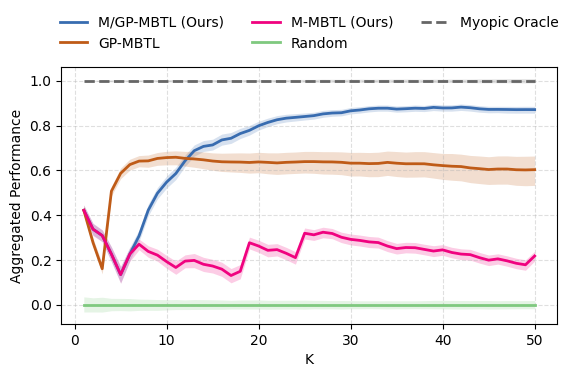

In [90]:
perf_dict = {}
multi_task_perf_arr = np.zeros((0,))
noise = 5
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
             for x_weight in x_weight_list
             for y_weight in y_weight_list
             for left_weight in dist_left_list]:
    K = 50
    data_path = f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

    # ✅ Use a dict instead of a DataFrame
    df_result = {}
    algs = (name_plot.keys() - ['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"])

    for alg_name in algs:
        # perf_data[alg_name] should have shape [num_trials, K]
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])

    # Both arrays have shape [1, K]
    mean_oracle = np.mean(df_result["Myopic Oracle"], axis=0, keepdims=True)
    mean_random = np.mean(df_result["Random"], axis=0, keepdims=True)

    for alg_name in algs:
        key = name_plot[alg_name]
        vals = df_result[key]

        # Normalize
        vals = vals - mean_random
        vals = vals / (mean_oracle - mean_random)

        # ✅ Safely accumulate into perf_dict
        if key not in perf_dict:
            perf_dict[key] = vals
        else:
            perf_dict[key] = np.concatenate([perf_dict[key], vals], axis=0)


# No change needed for the CI_axis and perf_summary code below
perf_summary = {}
for alg, vals in perf_dict.items():
    ci_low, ci_high = CI_axis(vals, axis=0)
    perf_summary[alg] = {
        "mean": np.round(np.mean(vals, axis=0), 4),
        "std": np.round(np.std(vals, axis=0), 4),
        "upper": np.round(ci_high, 4),
        "lower": np.round(ci_low, 4),
    }

perf_df = pd.DataFrame.from_dict(perf_summary, orient="index")

import numpy as np
import matplotlib.pyplot as plt

# Ensure the perf_df index is string-typed before lookup
perf_df.index = perf_df.index.astype(str)

fig, ax = plt.subplots(figsize=(6, 4))

for alg_key, label in name_plot.items():
    print(alg_key, label)
    # perf_df rows use labels such as "M/GP-MBTL (Ours)"
    if (label not in perf_df.index) or (label == "Independent Training"):
        # Skip algorithms that are missing in the current results
        continue

    # Pull mean / upper / lower and convert each to numpy arrays
    mean = np.array(perf_df.loc[label, "mean"], dtype=float)
    upper = np.array(perf_df.loc[label, "upper"], dtype=float)
    lower = np.array(perf_df.loc[label, "lower"], dtype=float)

    K = len(mean)
    x = np.arange(1, K + 1)   # Horizontal axis shows K = 1, 2, ..., K

    c = color.get(alg_key, None)
    ls = linestyle.get(alg_key, "-")

    # Plot the mean curve
    ax.plot(
        x,
        mean,
        label=label,
        linestyle=ls,
        color=c,
        linewidth=2,
    )

    # Use the CI bounds to draw a shaded band (upper/lower act as the limits)
    ax.fill_between(
        x,
        lower,
        upper,
        color=c,
        alpha=0.2,
        linewidth=0,
    )

ax.set_xlabel("K")
ax.set_ylabel("Aggregated Performance")
# ax.set_title("Aggregated Performance vs K")
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend(
    frameon=False,
    bbox_to_anchor=(0.5, 1.25),
    loc="upper center",
    ncol=3
)

plt.tight_layout()
plt.savefig("figures/any_K_plot_synt.png",dpi=300)
plt.show()


In [66]:
perf_dict = {}
multi_task_perf_arr = np.zeros((0,))
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['random_mountain', 'random_GP', "'M-MBTL + Random"]:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in (name_plot.keys() -['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"]):
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T
perf_df = perf_df.round(4)
display(perf_df)
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]

,mean,std,upper,lower
GP-MBTL,0.6032,0.9461,0.6681,0.5344
M-MBTL (Ours),0.2177,0.3278,0.2417,0.1958
M/GP-MBTL (Ours),0.8714,0.2059,0.8851,0.8574
Random,-0.0000,0.2663,0.0184,-0.0188
Independent Training,-0.9077,1.6539,-0.7955,-1.0173
Myopic Oracle,1.0000,0.1277,1.0088,0.9911


In [67]:
aggregate_results.to_csv("results/synt_g_noise5.csv")

In [68]:
import re
df = aggregate_results.copy()
# STEP 1: Define synthetic combinations
noise = 5
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

# STEP 2: Parse synthetic name
def parse_synth_name(name):
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    return x_val, y_val, left_val

def get_aggregated_ci(row_label):
    return (
        df.loc[row_label, "aggregated_mean"],
        df.loc[row_label, "aggregated_lower"],
        df.loc[row_label, "aggregated_upper"],
    )
# STEP 3: Method mapping and order
method_name_map = {
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL (Ours)":        "M-MBTL (Ours)",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL (Ours)",
    "Myopic Oracle":        "Myopic Oracle",
}
latex_method_order = list(method_name_map.values())

# STEP 4: Get (mean, lower, upper)
def get_mean_ci_synth(row_label, combo_name, df):
    mean_col = f"{combo_name}_mean"
    lower_col = f"{combo_name}_lower"
    upper_col = f"{combo_name}_upper"
    if mean_col not in df.columns:
        return None, None, None
    return df.loc[row_label, mean_col], df.loc[row_label, lower_col], df.loc[row_label, upper_col]

# STEP 5: Build LaTeX table with CI display
def is_not_significantly_lower_ci(upper, best_lower):
    return upper >= best_lower

latex_lines = []
table_header = r"""
\begin{table*}[!ht]
\begin{small}
\begin{center}
  \caption{Performance comparison on Synthetic Data ($\epsilon=\mathcal{N}(0, 5^2)$) with K=50.}
  \label{tab:synthetic-performance}
  \begin{tabular}{lll""" + "c" * (len(latex_method_order)-1)+"|"+"c" + "}\n"
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""
latex_lines.append(table_header)

for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    row_data = {}

    for short_meth in latex_method_order:
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break

        if df_row_label is not None and df_row_label in df.index:
            mean_val, lower_val, upper_val = get_mean_ci_synth(df_row_label, combo_name, df)
            row_data[short_meth] = (mean_val, lower_val, upper_val)
        else:
            row_data[short_meth] = (None, None, None)

    best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle" and v[1] is not None), default=None)

    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm" ##-#
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"

    for m in latex_method_order:
        mean_val, lower_val, upper_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
            if m != "Myopic Oracle" and is_not_significantly_lower_ci(upper_val, best_lower):
                cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
            else:
                cell_str = f"{{{mean_str}}} {ci_str}" 
        row_str += " & " + cell_str

    row_str += r"\\"
    latex_lines.append(row_str)

table_footer = r"""    \bottomrule
  \end{tabular}
  \end{center}
  \scriptsize{* \textit{Note}: Values are reported as the mean performance ± half the width of the 95\% confidence interval. Rows shaded in light gray indicate the synthetic settings that satisfy our proposed \textsc{Mountain} structure assumption. Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle.}
  \end{small}
\end{table*}
"""
latex_lines.append(table_footer)

row_data = {meth: get_aggregated_ci(meth) for meth in latex_method_order}
best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

row_prefix = r"\midrule" + "\n" + r"\multicolumn{3}{c}{\textbf{Aggregated Performance}}"
row_cells = []
for meth in latex_method_order:
    mean_val, lower_val, upper_val = row_data[meth]
    mean_str = f"{mean_val:.4f}"
    # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
    ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
    if meth != "Myopic Oracle" and upper_val >= best_lower:
        cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
    else:
        cell_str = f"{{{mean_str}}} {ci_str}" 
    row_cells.append(cell_str)

# Insert into existing LaTeX content before footer
latex_lines.insert(-1, row_prefix + " & " + " & ".join(row_cells) + r" \\")

output_tex_path = f"synthetic_performance_with_CI_noise={noise}.tex"
with open(output_tex_path, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

output_tex_path


'synthetic_performance_with_CI_noise=5.tex'

In [69]:
name_plot.keys()

dict_keys(['Combined_alg_mountain', 'MBTL', 'without_learning_weight', 'random_select', 'myopic_oracle', 'random_mountain', 'random_GP', 'independent_training'])

In [70]:
noise=0
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['random_mountain', 'random_GP', 'multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    aggregate_results[f"{name}_mean"] = df_result.mean()
    aggregate_results[f"{name}_std"] = df_result.std()
    aggregate_results[f"{name}_upper"] = df_result.apply(lambda col: CI(col.values)[1])
    aggregate_results[f"{name}_lower"] = df_result.apply(lambda col: CI(col.values)[0])
aggregate_results

,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_upper,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_lower,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise0_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,...,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_upper,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_lower,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_upper,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_lower,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_upper,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_lower
GP-MBTL,0.7250,0.0000,0.7250,0.7250,0.7110,0.0000,0.7110,0.7110,0.9091,0.0000,...,0.5714,0.5714,0.7000,0.0000,0.7000,0.7000,0.7857,0.0000,0.7857,0.7857
M-MBTL (Ours),0.7055,0.0000,0.7055,0.7055,0.7187,0.0000,0.7187,0.7187,0.8736,0.0000,...,0.5535,0.5535,0.6772,0.0000,0.6772,0.6772,0.7678,0.0000,0.7678,0.7678
M/GP-MBTL (Ours),0.7250,0.0000,0.7250,0.7250,0.7187,0.0000,0.7187,0.7187,0.9091,0.0000,...,0.5714,0.5714,0.7000,0.0000,0.7000,0.7000,0.7857,0.0000,0.7857,0.7857
Random,0.7028,0.0054,0.7039,0.7018,0.7122,0.0011,0.7124,0.7120,0.8688,0.0099,...,0.5543,0.5489,0.6761,0.0161,0.6792,0.6729,0.7660,0.0140,0.7687,0.7633
Independent Training,0.6750,0.0000,0.6750,0.6750,0.7500,0.0000,0.7500,0.7500,0.8182,0.0000,...,0.5000,0.5000,0.6000,0.0000,0.6000,0.6000,0.7143,0.0000,0.7143,0.7143
Myopic Oracle,0.7250,0.0000,0.7250,0.7250,0.7190,0.0000,0.7190,0.7190,0.9091,0.0000,...,0.5714,0.5714,0.7000,0.0000,0.7000,0.7000,0.7857,0.0000,0.7857,0.7857


In [71]:
perf_dict = {}
multi_task_perf_arr = np.zeros((0,))
for name in [f"synt_g_noise{noise}_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=50
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in (name_plot.keys() -['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"]):
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,K-1]
    mean_oracle = np.mean(df_result["Myopic Oracle"])
    mean_random = np.mean(df_result["Random"])
    for alg_name in (name_plot.keys() -['multi_task', "random_mountain", "random_GP", "M-MBTL + Random"]):
        df_result[name_plot[alg_name]] -= mean_random
        df_result[name_plot[alg_name]] /= mean_oracle - mean_random
        if not (name_plot[alg_name] in perf_dict.keys()):
            perf_dict[name_plot[alg_name]] = np.zeros((0,))
        perf_dict[name_plot[alg_name]] = np.concatenate([perf_dict[name_plot[alg_name]], df_result[name_plot[alg_name]]])
perf_df = pd.DataFrame({
    alg: [np.mean(vals), np.std(vals), CI(vals)[1], CI(vals)[0]]
    for alg, vals in perf_dict.items()
}, index=["mean", "std", "upper", "lower"]).T
perf_df = perf_df.round(4)
display(perf_df)
aggregate_results["aggregated_mean"] = perf_df["mean"]
aggregate_results["aggregated_std"] = perf_df["std"]
aggregate_results["aggregated_upper"] = perf_df["upper"]
aggregate_results["aggregated_lower"] = perf_df["lower"]

,mean,std,upper,lower
GP-MBTL,0.8368,0.3855,0.8638,0.8095
M-MBTL (Ours),0.3010,0.3751,0.3281,0.2752
M/GP-MBTL (Ours),0.9873,0.0221,0.9888,0.9857
Random,-0.0000,0.5091,0.0342,-0.0374
Independent Training,-0.3909,3.4804,-0.1548,-0.6304
Myopic Oracle,1.0000,0.0000,1.0000,1.0000


In [72]:
aggregate_results.to_csv("results/synt_g_noise0.csv")

In [73]:
import re
df = aggregate_results.copy()
# STEP 1: Define synthetic combinations
noise = 0
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

# STEP 2: Parse synthetic name
def parse_synth_name(name):
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    return x_val, y_val, left_val

def get_aggregated_ci(row_label):
    return (
        df.loc[row_label, "aggregated_mean"],
        df.loc[row_label, "aggregated_lower"],
        df.loc[row_label, "aggregated_upper"],
    )
# STEP 3: Method mapping and order
method_name_map = {
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL (Ours)":        "M-MBTL (Ours)",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL (Ours)",
    "Myopic Oracle":        "Myopic Oracle",
}
latex_method_order = list(method_name_map.values())

# STEP 4: Get (mean, lower, upper)
def get_mean_ci_synth(row_label, combo_name, df):
    mean_col = f"{combo_name}_mean"
    lower_col = f"{combo_name}_lower"
    upper_col = f"{combo_name}_upper"
    if mean_col not in df.columns:
        return None, None, None
    return df.loc[row_label, mean_col], df.loc[row_label, lower_col], df.loc[row_label, upper_col]

# STEP 5: Build LaTeX table with CI display
def is_not_significantly_lower_ci(upper, best_lower):
    return upper >= best_lower

latex_lines = []
table_header = r"""
\begin{table*}[!ht]
\begin{small}
\begin{center}
  \caption{Performance comparison on Synthetic Data ($\epsilon=0$) with K=50.}
  \label{tab:synthetic-performance-noise0}
  \begin{tabular}{lll""" + "c" * (len(latex_method_order)-1)+"|"+"c" + "}\n"
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""
latex_lines.append(table_header)

for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    row_data = {}

    for short_meth in latex_method_order:
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break

        if df_row_label is not None and df_row_label in df.index:
            mean_val, lower_val, upper_val = get_mean_ci_synth(df_row_label, combo_name, df)
            row_data[short_meth] = (mean_val, lower_val, upper_val)
        else:
            row_data[short_meth] = (None, None, None)

    best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle" and v[1] is not None), default=None)

    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"

    for m in latex_method_order:
        mean_val, lower_val, upper_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
            if m != "Myopic Oracle" and is_not_significantly_lower_ci(upper_val, best_lower):
                cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
            else:
                cell_str = f"{{{mean_str}}} {ci_str}" 
        row_str += " & " + cell_str

    row_str += r"\\"
    latex_lines.append(row_str)

table_footer = r"""    \bottomrule
  \end{tabular}
  \end{center}
  \scriptsize{* \textit{Note}: Values are reported as the mean performance ± half the width of the 95\% confidence interval. Rows shaded in light gray indicate the synthetic settings that satisfy our proposed \textsc{Mountain} structure assumption. Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle.}
  \end{small}
\end{table*}
"""
latex_lines.append(table_footer)

row_data = {meth: get_aggregated_ci(meth) for meth in latex_method_order}
best_lower = max((v[1] for k, v in row_data.items() if k != "Myopic Oracle"), default=None)

row_prefix = r"\midrule" + "\n" + r"\multicolumn{3}{c}{\textbf{Aggregated Performance}}"
row_cells = []
for meth in latex_method_order:
    mean_val, lower_val, upper_val = row_data[meth]
    mean_str = f"{mean_val:.4f}"
    # ci_str = f"({lower_val:.4f}, {upper_val:.4f})"
    ci_str = f"$\pm$ {((upper_val-lower_val)/2):.4f}"
    if meth != "Myopic Oracle" and upper_val >= best_lower:
        cell_str = f"\\textbf{{{mean_str}}} {ci_str}" 
    else:
        cell_str = f"{{{mean_str}}} {ci_str}" 
    row_cells.append(cell_str)

# Insert into existing LaTeX content before footer
latex_lines.insert(-1, row_prefix + " & " + " & ".join(row_cells) + r" \\")

output_tex_path = f"synthetic_performance_with_CI_noise={noise}.tex"
with open(output_tex_path, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

output_tex_path


'synthetic_performance_with_CI_noise=0.tex'